In [ ]:
#Connect your Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import all packages

import pandas as pd
import numpy as np
from datetime import timedelta, datetime

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

import xgboost as xgb

import plotly.graph_objects as go

import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
from sklearn.svm import SVC,SVR
from sklearn import datasets
import scipy.stats as stats

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

In [ ]:
# import packages
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import MinMaxScaler

In [ ]:
df = pd.read_excel('drive/My Drive/nawell data preprosecing/data_new.xlsx')

In [ ]:
date_time = pd.to_datetime(df.pop('datetime'), format='%d.%m.%Y')

In [ ]:
timestamp_s = date_time.map(datetime.datetime.timestamp)

In [ ]:
day = 24*60*60
year = (365.2425)*day

df['Day'] = np.log10(timestamp_s * (2 * np.pi / day))
df['Year'] = np.log10(timestamp_s * (2 * np.pi / year))

In [ ]:
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(df)
train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

num_features = df.shape[1]

In [ ]:
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

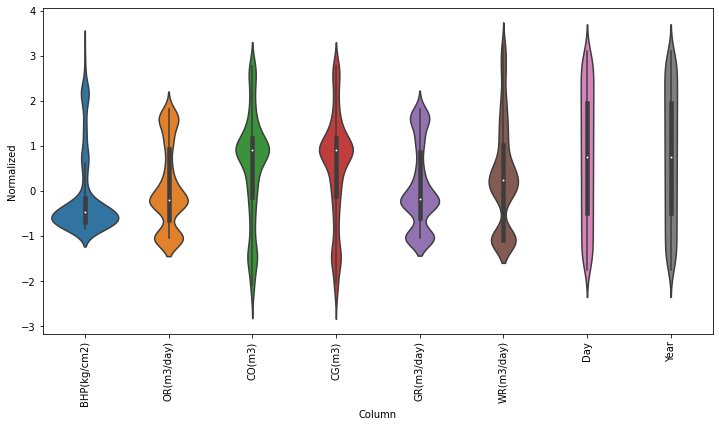

In [ ]:
df_std = (df - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)

In [ ]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

In [ ]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [ ]:
def plot(self, model=None, plot_col='BHP(kg/cm2)', max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [day]')

WindowGenerator.plot = plot

In [ ]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.preprocessing.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

In [ ]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [ ]:
single_step_window = WindowGenerator(
    # `WindowGenerator` returns all features as labels if you
    # don't set the `label_columns` argument.
    input_width=1, label_width=1, shift=1)

wide_window = WindowGenerator(
    input_width=30, label_width=30, shift=1)

for example_inputs, example_labels in wide_window.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 30, 8)
Labels shape (batch, time, features): (32, 30, 8)


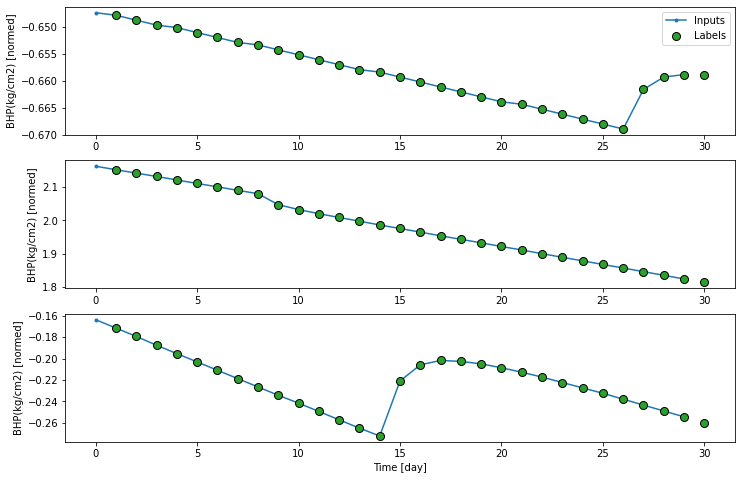

In [ ]:
wide_window.plot()

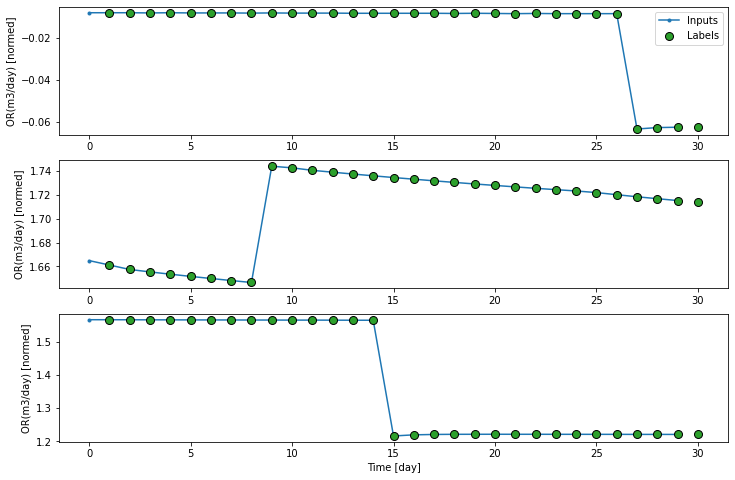

In [ ]:
wide_window.plot(plot_col='OR(m3/day)')

In [ ]:
num_features

8

***Baseline***

In [ ]:
class Baseline(tf.keras.Model):
  def __init__(self, label_index=None):
    super().__init__()
    self.label_index = label_index

  def call(self, inputs):
    if self.label_index is None:
      return inputs
    result = inputs[:, :, self.label_index]
    return result[:, :, tf.newaxis]

In [ ]:
baseline = Baseline()
baseline.compile(loss=tf.losses.MeanSquaredError(),
                 metrics=[tf.metrics.MeanAbsoluteError()])

In [ ]:
val_performance = {}
performance = {}
val_performance['Baseline'] = baseline.evaluate(wide_window.val)
performance['Baseline'] = baseline.evaluate(wide_window.test, verbose=0)

14/14 [==============================] - 0s 2ms/step - loss: 5.0215e-04 - mean_absolute_error: 0.0036


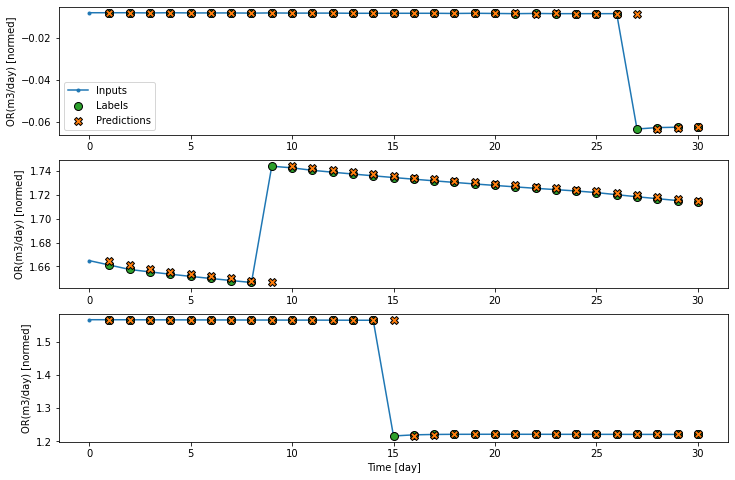

In [ ]:
wide_window.plot(baseline , plot_col='OR(m3/day)')

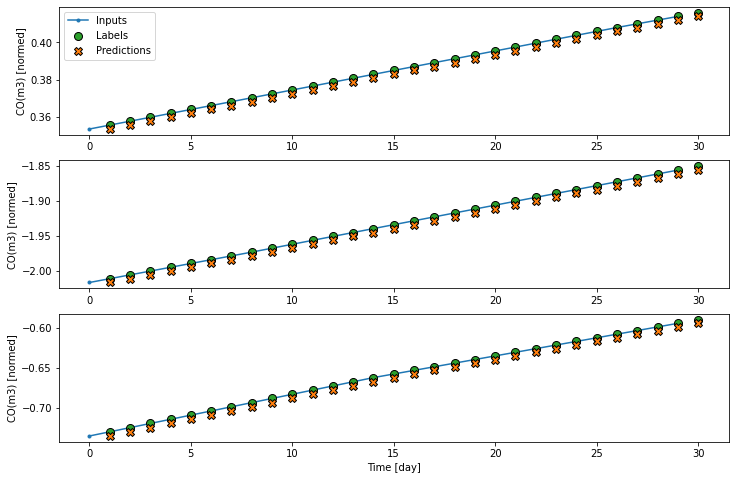

In [ ]:
wide_window.plot(baseline , plot_col='CO(m3)')

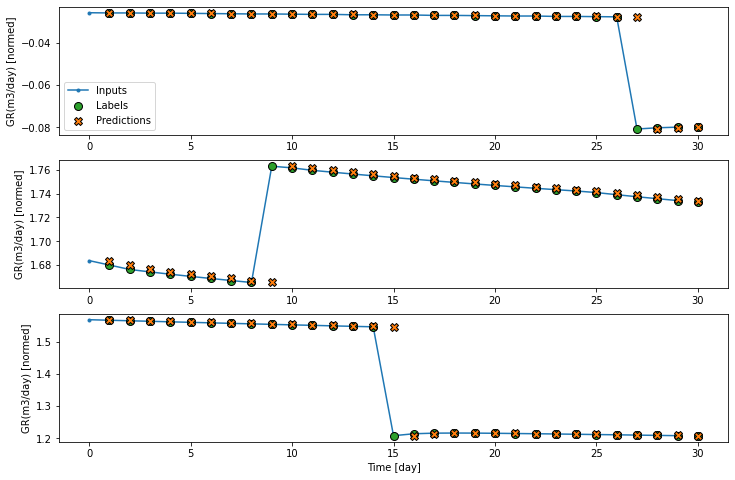

In [ ]:
wide_window.plot(baseline , plot_col='GR(m3/day)')

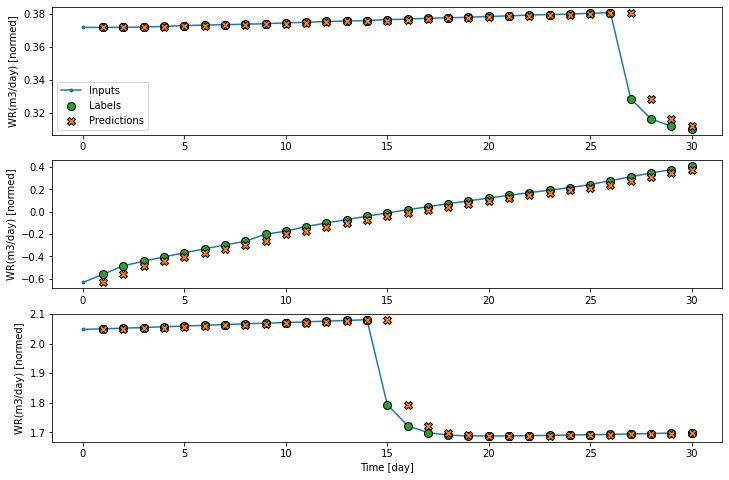

In [ ]:
wide_window.plot(baseline , plot_col='WR(m3/day)')

***Dense***

In [ ]:
# This returns a multi-layer-perceptron model in Keras.
def get_keras_model(num_hidden_layers,
                    num_neurons_per_layer,
                    activation):
    # create the MLP model.

    # define the layers.
    inputs = tf.keras.Input(shape=(30,8))  # input layer.

    # Add the hidden layers.
    for i in range(num_hidden_layers):
        x = layers.Dense(num_neurons_per_layer,
                         activation=activation)(inputs)

    # output layer.
    outputs = layers.Dense(num_features)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model


# This function takes in the hyperparameters and returns a score (Cross validation).
def keras_mlp_cv_score(parameterization, weight=None):

    model = get_keras_model(parameterization.get('num_hidden_layers'),
                            parameterization.get('neurons_per_layer'),
                            parameterization.get('activation'))

    opt = parameterization.get('optimizer')
    opt = opt.lower()

    learning_rate = parameterization.get('learning_rate')

    if opt == 'Nadam':
        optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif opt == 'rms':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    NUM_EPOCHS = 50

    # Specify the training configuration.
    model.compile(optimizer=optimizer,
                  loss=tf.keras.losses.MeanSquaredError(),
                  metrics=[tf.metrics.MeanAbsoluteError()])

    data = wide_window.train
    # fit the model using a 20% validation set.
    res = model.fit(data, epochs=NUM_EPOCHS, batch_size=parameterization.get('batch_size'),
                    validation_data=wide_window.val)

    # look at the last 10 epochs. Get the mean and standard deviation of the validation score.
    last10_scores = np.array(res.history['val_loss'][-10:])
    mean = last10_scores.mean()
    sem = last10_scores.std()

    # If the model didn't converge then set a high loss.
    if np.isnan(mean):
        return 9999.0, 0.0

    return mean, sem

In [ ]:
# Define the search space.
parameters=[
    {
        "name": "learning_rate",
        "type": "range",
        "bounds": [0.0001, 0.5],
        "log_scale": True,
    },
    {
        "name": "num_hidden_layers",
        "type": "range",
        "bounds": [1, 10],
        "value_type": "int"
    },
    {
        "name": "neurons_per_layer",
        "type": "range",
        "bounds": [1, 300],
        "value_type": "int"
    },
    {
        "name": "batch_size",
        "type": "choice",
        "values": [8, 16, 32, 64, 128, 256],
    },

    {
        "name": "activation",
        "type": "choice",
        "values": ['linear','sigmoid', 'relu'],
    },
    {
        "name": "optimizer",
        "type": "choice",
        "values": ['Nadam', 'rms', 'Adam'],
    },
]

In [ ]:
!pip install ax-platform

In [ ]:
# import more packages
from ax.service.ax_client import AxClient
from ax.utils.notebook.plotting import render, init_notebook_plotting

init_notebook_plotting()

ax_client = AxClient()

# create the experiment.
ax_client.create_experiment(
    name="keras_experiment",
    parameters=parameters,
    objective_name='keras_cv',
    minimize=True)

def evaluate(parameters):
    return {"keras_cv": keras_mlp_cv_score(parameters)}

# Based on the search space, this will use Sobol (https://en.wikipedia.org/wiki/Sobol_sequence) instead of a Guassian Process (GPEI).
#
# From the source code:
#     """We should use only Sobol and not GPEI if:
#     1. there are less continuous parameters in the search space than the sum of
#     options for the choice parameters,
#     2. the number of total iterations in the optimization is known in advance and
#     there are less distinct points in the search space than the known intended
#     number of total iterations.
#     """

# Sobol sequences seem to be better than random for high-dimensional spaces:
# https://en.wikipedia.org/wiki/Quasi-Monte_Carlo_method

[INFO 06-27 12:42:23] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


[INFO 06-27 12:42:23] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 2 decimal points.
[INFO 06-27 12:42:23] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter learning_rate. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-27 12:42:23] ax.service.utils.instantiation: Inferred value type of ParameterType.INT for parameter batch_size. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-27 12:42:23] ax.service.utils.instantiation: Inferred value type of ParameterType.STRING for parameter activation. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-2

In [ ]:
for i in range(25):
    parameters, trial_index = ax_client.get_next_trial()
    ax_client.complete_trial(trial_index=trial_index, raw_data=evaluate(parameters))

[INFO 06-27 12:42:31] ax.service.ax_client: Generated new trial 0 with parameters {'learning_rate': 0.01, 'num_hidden_layers': 8, 'neurons_per_layer': 122, 'batch_size': 64, 'activation': 'sigmoid', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.2412 - mean_absolute_error: 0.3220 - val_loss: 0.4049 - val_mean_absolute_error: 0.4804
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0188 - mean_absolute_error: 0.0875 - val_loss: 0.1769 - val_mean_absolute_error: 0.2979
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0573 - val_loss: 0.1365 - val_mean_absolute_error: 0.2638
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0067 - mean_absolute_error: 0.0451 - val_loss: 0.1062 - val_mean_absolute_error: 0.2231
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0053 - mean_absolute_error: 0.0354 - val_loss: 0.0781 - val_mean_absolute_error: 0.1783
Epoch 6/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0047 - mean_absolute_error: 0.0300 - val_loss: 0.0716 - val_mean_absolute_error: 0.1651
Epoch 7/50
49/49 [==========

[INFO 06-27 12:42:55] ax.service.ax_client: Completed trial 0 with data: {'keras_cv': (0.03, 0.0)}.
[INFO 06-27 12:42:56] ax.service.ax_client: Generated new trial 1 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 10, 'neurons_per_layer': 278, 'batch_size': 128, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.0498 - mean_absolute_error: 0.1190 - val_loss: 0.0461 - val_mean_absolute_error: 0.1394
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0182 - mean_absolute_error: 0.0838 - val_loss: 0.0368 - val_mean_absolute_error: 0.1201
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0151 - mean_absolute_error: 0.0783 - val_loss: 0.0315 - val_mean_absolute_error: 0.1159
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0138 - mean_absolute_error: 0.0759 - val_loss: 0.0384 - val_mean_absolute_error: 0.1384
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0122 - mean_absolute_error: 0.0666 - val_loss: 0.0366 - val_mean_absolute_error: 0.1433
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0115 - mean_absolute_error: 0.0616 - val_loss: 0.0774 - val_mean_absolute_error: 0.2221
Epoch 7/50
49/49 [==========

[INFO 06-27 12:43:21] ax.service.ax_client: Completed trial 1 with data: {'keras_cv': (0.09, 0.02)}.
[INFO 06-27 12:43:21] ax.service.ax_client: Generated new trial 2 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 10, 'neurons_per_layer': 77, 'batch_size': 256, 'activation': 'linear', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.1812 - mean_absolute_error: 0.2538 - val_loss: 0.2840 - val_mean_absolute_error: 0.3612
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0154 - mean_absolute_error: 0.0753 - val_loss: 0.1855 - val_mean_absolute_error: 0.2844
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0071 - mean_absolute_error: 0.0458 - val_loss: 0.0825 - val_mean_absolute_error: 0.1610
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0052 - mean_absolute_error: 0.0334 - val_loss: 0.0595 - val_mean_absolute_error: 0.1452
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0305 - val_loss: 0.0434 - val_mean_absolute_error: 0.1227
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0047 - mean_absolute_error: 0.0282 - val_loss: 0.0346 - val_mean_absolute_error: 0.1158
Epoch 7/50
49/49 [==========

[INFO 06-27 12:43:46] ax.service.ax_client: Completed trial 2 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 12:43:46] ax.service.ax_client: Generated new trial 3 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 87, 'batch_size': 32, 'activation': 'linear', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 7ms/step - loss: 0.2185 - mean_absolute_error: 0.2813 - val_loss: 0.1441 - val_mean_absolute_error: 0.2870
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0131 - mean_absolute_error: 0.0654 - val_loss: 0.0654 - val_mean_absolute_error: 0.1741
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0063 - mean_absolute_error: 0.0389 - val_loss: 0.0414 - val_mean_absolute_error: 0.1375
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0293 - val_loss: 0.0329 - val_mean_absolute_error: 0.1184
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0042 - mean_absolute_error: 0.0238 - val_loss: 0.0264 - val_mean_absolute_error: 0.0976
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0040 - mean_absolute_error: 0.0206 - val_loss: 0.0235 - val_mean_absolute_error: 0.0909
Epoch 7/50
49/49 [==========

[INFO 06-27 12:44:11] ax.service.ax_client: Completed trial 3 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 12:44:11] ax.service.ax_client: Generated new trial 4 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 9, 'neurons_per_layer': 88, 'batch_size': 64, 'activation': 'sigmoid', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.2925 - mean_absolute_error: 0.3598 - val_loss: 0.3925 - val_mean_absolute_error: 0.4996
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0337 - mean_absolute_error: 0.1255 - val_loss: 0.2760 - val_mean_absolute_error: 0.3990
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0175 - mean_absolute_error: 0.0848 - val_loss: 0.1908 - val_mean_absolute_error: 0.3213
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0107 - mean_absolute_error: 0.0637 - val_loss: 0.1508 - val_mean_absolute_error: 0.2882
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0084 - mean_absolute_error: 0.0549 - val_loss: 0.1279 - val_mean_absolute_error: 0.2550
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0070 - mean_absolute_error: 0.0475 - val_loss: 0.1137 - val_mean_absolute_error: 0.2326
Epoch 7/50
49/49 [==========

[INFO 06-27 12:44:38] ax.service.ax_client: Completed trial 4 with data: {'keras_cv': (0.06, 0.0)}.
[INFO 06-27 12:44:38] ax.service.ax_client: Generated new trial 5 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 5, 'neurons_per_layer': 62, 'batch_size': 128, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.0957 - mean_absolute_error: 0.1646 - val_loss: 0.2919 - val_mean_absolute_error: 0.4053
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0074 - mean_absolute_error: 0.0468 - val_loss: 0.1347 - val_mean_absolute_error: 0.2516
Epoch 3/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0062 - mean_absolute_error: 0.0405 - val_loss: 0.1277 - val_mean_absolute_error: 0.2373
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0062 - mean_absolute_error: 0.0377 - val_loss: 0.1426 - val_mean_absolute_error: 0.2529
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0057 - mean_absolute_error: 0.0368 - val_loss: 0.1264 - val_mean_absolute_error: 0.2277
Epoch 6/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0058 - mean_absolute_error: 0.0359 - val_loss: 0.1249 - val_mean_absolute_error: 0.2243
Epoch 7/50
49/49 [==========

[INFO 06-27 12:45:03] ax.service.ax_client: Completed trial 5 with data: {'keras_cv': (0.08, 0.01)}.
[INFO 06-27 12:45:03] ax.service.ax_client: Generated new trial 6 with parameters {'learning_rate': 0.2, 'num_hidden_layers': 4, 'neurons_per_layer': 201, 'batch_size': 256, 'activation': 'sigmoid', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 17.1480 - mean_absolute_error: 2.3556 - val_loss: 0.7535 - val_mean_absolute_error: 0.6608
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0749 - mean_absolute_error: 0.1626 - val_loss: 0.5451 - val_mean_absolute_error: 0.5577
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0077 - mean_absolute_error: 0.0472 - val_loss: 0.5219 - val_mean_absolute_error: 0.5475
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0053 - mean_absolute_error: 0.0345 - val_loss: 0.4928 - val_mean_absolute_error: 0.5279
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0050 - mean_absolute_error: 0.0314 - val_loss: 0.4732 - val_mean_absolute_error: 0.5151
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0049 - mean_absolute_error: 0.0296 - val_loss: 0.4464 - val_mean_absolute_error: 0.4990
Epoch 7/50
49/49 [=========

[INFO 06-27 12:45:27] ax.service.ax_client: Completed trial 6 with data: {'keras_cv': (0.24, 0.01)}.
[INFO 06-27 12:45:28] ax.service.ax_client: Generated new trial 7 with parameters {'learning_rate': 0.02, 'num_hidden_layers': 8, 'neurons_per_layer': 273, 'batch_size': 256, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 10ms/step - loss: 0.4158 - mean_absolute_error: 0.2844 - val_loss: 0.5592 - val_mean_absolute_error: 0.6960
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0660 - mean_absolute_error: 0.1668 - val_loss: 0.4074 - val_mean_absolute_error: 0.5509
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0423 - mean_absolute_error: 0.1407 - val_loss: 0.3136 - val_mean_absolute_error: 0.4213
Epoch 4/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0313 - mean_absolute_error: 0.1154 - val_loss: 0.2778 - val_mean_absolute_error: 0.4153
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0233 - mean_absolute_error: 0.1035 - val_loss: 0.4912 - val_mean_absolute_error: 0.4340
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0211 - mean_absolute_error: 0.0986 - val_loss: 0.4857 - val_mean_absolute_error: 0.4949
Epoch 7/50
49/49 [=========

[INFO 06-27 12:45:52] ax.service.ax_client: Completed trial 7 with data: {'keras_cv': (0.8, 0.1)}.
[INFO 06-27 12:45:52] ax.service.ax_client: Generated new trial 8 with parameters {'learning_rate': 0.06, 'num_hidden_layers': 7, 'neurons_per_layer': 221, 'batch_size': 128, 'activation': 'linear', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.9867 - mean_absolute_error: 0.5832 - val_loss: 0.0943 - val_mean_absolute_error: 0.2236
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0090 - mean_absolute_error: 0.0508 - val_loss: 0.0112 - val_mean_absolute_error: 0.0648
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0037 - mean_absolute_error: 0.0151 - val_loss: 0.0060 - val_mean_absolute_error: 0.0446
Epoch 4/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0036 - mean_absolute_error: 0.0115 - val_loss: 0.0026 - val_mean_absolute_error: 0.0316
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0035 - mean_absolute_error: 0.0101 - val_loss: 0.0020 - val_mean_absolute_error: 0.0298
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0036 - mean_absolute_error: 0.0109 - val_loss: 0.0013 - val_mean_absolute_error: 0.0222
Epoch 7/50
49/49 [==========

[INFO 06-27 12:46:17] ax.service.ax_client: Completed trial 8 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 12:46:17] ax.service.ax_client: Generated new trial 9 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 6, 'neurons_per_layer': 267, 'batch_size': 64, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.0553 - mean_absolute_error: 0.1157 - val_loss: 0.1458 - val_mean_absolute_error: 0.2816
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0096 - mean_absolute_error: 0.0559 - val_loss: 0.1036 - val_mean_absolute_error: 0.2171
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0082 - mean_absolute_error: 0.0506 - val_loss: 0.0719 - val_mean_absolute_error: 0.1662
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0083 - mean_absolute_error: 0.0483 - val_loss: 0.0789 - val_mean_absolute_error: 0.1919
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0073 - mean_absolute_error: 0.0430 - val_loss: 0.0646 - val_mean_absolute_error: 0.1770
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0075 - mean_absolute_error: 0.0457 - val_loss: 0.0617 - val_mean_absolute_error: 0.1542
Epoch 7/50
49/49 [==========

[INFO 06-27 12:46:43] ax.service.ax_client: Completed trial 9 with data: {'keras_cv': (0.05, 0.01)}.
[INFO 06-27 12:46:43] ax.service.ax_client: Generated new trial 10 with parameters {'learning_rate': 0.01, 'num_hidden_layers': 8, 'neurons_per_layer': 61, 'batch_size': 16, 'activation': 'sigmoid', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.1957 - mean_absolute_error: 0.2839 - val_loss: 0.3565 - val_mean_absolute_error: 0.4349
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0187 - mean_absolute_error: 0.0850 - val_loss: 0.2287 - val_mean_absolute_error: 0.3459
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0085 - mean_absolute_error: 0.0526 - val_loss: 0.1703 - val_mean_absolute_error: 0.2983
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0061 - mean_absolute_error: 0.0408 - val_loss: 0.1432 - val_mean_absolute_error: 0.2586
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0052 - mean_absolute_error: 0.0343 - val_loss: 0.1285 - val_mean_absolute_error: 0.2359
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0309 - val_loss: 0.1163 - val_mean_absolute_error: 0.2197
Epoch 7/50
49/49 [==========

[INFO 06-27 12:47:07] ax.service.ax_client: Completed trial 10 with data: {'keras_cv': (0.06, 0.0)}.
[INFO 06-27 12:47:07] ax.service.ax_client: Generated new trial 11 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 104, 'batch_size': 256, 'activation': 'linear', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.1263 - mean_absolute_error: 0.2142 - val_loss: 0.1797 - val_mean_absolute_error: 0.2763
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0549 - val_loss: 0.0766 - val_mean_absolute_error: 0.1759
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0052 - mean_absolute_error: 0.0331 - val_loss: 0.0496 - val_mean_absolute_error: 0.1272
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0043 - mean_absolute_error: 0.0236 - val_loss: 0.0421 - val_mean_absolute_error: 0.1113
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0041 - mean_absolute_error: 0.0202 - val_loss: 0.0346 - val_mean_absolute_error: 0.1014
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0040 - mean_absolute_error: 0.0183 - val_loss: 0.0291 - val_mean_absolute_error: 0.0947
Epoch 7/50
49/49 [==========

[INFO 06-27 12:47:31] ax.service.ax_client: Completed trial 11 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 12:47:31] ax.service.ax_client: Generated new trial 12 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 10, 'neurons_per_layer': 261, 'batch_size': 8, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.1267 - mean_absolute_error: 0.2027 - val_loss: 0.2854 - val_mean_absolute_error: 0.4266
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0061 - mean_absolute_error: 0.0388 - val_loss: 0.0889 - val_mean_absolute_error: 0.2112
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0052 - mean_absolute_error: 0.0318 - val_loss: 0.0703 - val_mean_absolute_error: 0.1742
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0051 - mean_absolute_error: 0.0314 - val_loss: 0.0636 - val_mean_absolute_error: 0.1599
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0288 - val_loss: 0.0769 - val_mean_absolute_error: 0.1892
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0283 - val_loss: 0.0559 - val_mean_absolute_error: 0.1566
Epoch 7/50
49/49 [==========

[INFO 06-27 12:47:57] ax.service.ax_client: Completed trial 12 with data: {'keras_cv': (0.04, 0.0)}.
[INFO 06-27 12:47:58] ax.service.ax_client: Generated new trial 13 with parameters {'learning_rate': 0.05, 'num_hidden_layers': 5, 'neurons_per_layer': 46, 'batch_size': 8, 'activation': 'relu', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.0678 - mean_absolute_error: 0.1470 - val_loss: 0.3034 - val_mean_absolute_error: 0.3218
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0053 - mean_absolute_error: 0.0337 - val_loss: 0.2986 - val_mean_absolute_error: 0.3527
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0044 - mean_absolute_error: 0.0239 - val_loss: 0.2901 - val_mean_absolute_error: 0.3373
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0040 - mean_absolute_error: 0.0196 - val_loss: 0.2715 - val_mean_absolute_error: 0.3241
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0039 - mean_absolute_error: 0.0187 - val_loss: 0.2514 - val_mean_absolute_error: 0.3144
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0043 - mean_absolute_error: 0.0219 - val_loss: 0.2301 - val_mean_absolute_error: 0.2989
Epoch 7/50
49/49 [==========

[INFO 06-27 12:48:21] ax.service.ax_client: Completed trial 13 with data: {'keras_cv': (0.26, 0.03)}.
[INFO 06-27 12:48:21] ax.service.ax_client: Generated new trial 14 with parameters {'learning_rate': 0.11, 'num_hidden_layers': 3, 'neurons_per_layer': 180, 'batch_size': 256, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 342.2232 - mean_absolute_error: 5.5396 - val_loss: 7.1855 - val_mean_absolute_error: 2.0656
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 2.4631 - mean_absolute_error: 0.7745 - val_loss: 2.3301 - val_mean_absolute_error: 0.9291
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.2586 - mean_absolute_error: 0.3084 - val_loss: 1.1678 - val_mean_absolute_error: 0.6469
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.1931 - mean_absolute_error: 0.2960 - val_loss: 2.6703 - val_mean_absolute_error: 1.0220
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.1605 - mean_absolute_error: 0.2736 - val_loss: 4.8168 - val_mean_absolute_error: 1.4752
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.1994 - mean_absolute_error: 0.3052 - val_loss: 5.7798 - val_mean_absolute_error: 1.6383
Epoch 7/50
49/49 [========

[INFO 06-27 12:48:50] ax.service.ax_client: Completed trial 14 with data: {'keras_cv': (4.69, 0.49)}.
[INFO 06-27 12:48:50] ax.service.ax_client: Generated new trial 15 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 1, 'neurons_per_layer': 232, 'batch_size': 128, 'activation': 'linear', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.0565 - mean_absolute_error: 0.1283 - val_loss: 0.0434 - val_mean_absolute_error: 0.1354
Epoch 2/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0179 - mean_absolute_error: 0.0839 - val_loss: 0.0455 - val_mean_absolute_error: 0.1576
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0153 - mean_absolute_error: 0.0802 - val_loss: 0.0238 - val_mean_absolute_error: 0.1155
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0141 - mean_absolute_error: 0.0726 - val_loss: 0.0514 - val_mean_absolute_error: 0.1851
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0117 - mean_absolute_error: 0.0663 - val_loss: 0.0259 - val_mean_absolute_error: 0.1372
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0108 - mean_absolute_error: 0.0631 - val_loss: 0.0067 - val_mean_absolute_error: 0.0591
Epoch 7/50
49/49 [==========

[INFO 06-27 12:49:14] ax.service.ax_client: Completed trial 15 with data: {'keras_cv': (0.01, 0.01)}.
[INFO 06-27 12:49:15] ax.service.ax_client: Generated new trial 16 with parameters {'learning_rate': 0.16, 'num_hidden_layers': 9, 'neurons_per_layer': 246, 'batch_size': 64, 'activation': 'linear', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 118.3554 - mean_absolute_error: 6.5078 - val_loss: 2.1717 - val_mean_absolute_error: 0.9640
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 1.3281 - mean_absolute_error: 0.8157 - val_loss: 0.4460 - val_mean_absolute_error: 0.6079
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.2304 - mean_absolute_error: 0.3362 - val_loss: 0.0911 - val_mean_absolute_error: 0.2387
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0079 - mean_absolute_error: 0.0518 - val_loss: 0.0293 - val_mean_absolute_error: 0.1225
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0050 - mean_absolute_error: 0.0313 - val_loss: 0.0217 - val_mean_absolute_error: 0.0854
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0042 - mean_absolute_error: 0.0226 - val_loss: 0.0152 - val_mean_absolute_error: 0.0724
Epoch 7/50
49/49 [========

[INFO 06-27 12:49:41] ax.service.ax_client: Completed trial 16 with data: {'keras_cv': (0.01, 0.01)}.
[INFO 06-27 12:49:41] ax.service.ax_client: Generated new trial 17 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 8, 'neurons_per_layer': 119, 'batch_size': 8, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 10ms/step - loss: 0.4122 - mean_absolute_error: 0.4804 - val_loss: 0.9989 - val_mean_absolute_error: 0.8006
Epoch 2/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0414 - mean_absolute_error: 0.1327 - val_loss: 0.5400 - val_mean_absolute_error: 0.5757
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0091 - mean_absolute_error: 0.0493 - val_loss: 0.2256 - val_mean_absolute_error: 0.3472
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0269 - val_loss: 0.1024 - val_mean_absolute_error: 0.2151
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0040 - mean_absolute_error: 0.0204 - val_loss: 0.0842 - val_mean_absolute_error: 0.1924
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0039 - mean_absolute_error: 0.0183 - val_loss: 0.0794 - val_mean_absolute_error: 0.1897
Epoch 7/50
49/49 [=========

[INFO 06-27 12:50:06] ax.service.ax_client: Completed trial 17 with data: {'keras_cv': (0.05, 0.0)}.
[INFO 06-27 12:50:06] ax.service.ax_client: Generated new trial 18 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 136, 'batch_size': 256, 'activation': 'linear', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 7ms/step - loss: 0.2865 - mean_absolute_error: 0.3462 - val_loss: 0.4369 - val_mean_absolute_error: 0.5074
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0181 - mean_absolute_error: 0.0852 - val_loss: 0.1894 - val_mean_absolute_error: 0.3298
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0089 - mean_absolute_error: 0.0566 - val_loss: 0.1346 - val_mean_absolute_error: 0.2654
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0065 - mean_absolute_error: 0.0436 - val_loss: 0.1020 - val_mean_absolute_error: 0.2218
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0054 - mean_absolute_error: 0.0356 - val_loss: 0.0800 - val_mean_absolute_error: 0.1890
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0294 - val_loss: 0.0618 - val_mean_absolute_error: 0.1583
Epoch 7/50
49/49 [==========

[INFO 06-27 12:50:34] ax.service.ax_client: Completed trial 18 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 12:50:34] ax.service.ax_client: Generated new trial 19 with parameters {'learning_rate': 0.22, 'num_hidden_layers': 8, 'neurons_per_layer': 53, 'batch_size': 16, 'activation': 'linear', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 1593.9546 - mean_absolute_error: 13.5473 - val_loss: 275.5725 - val_mean_absolute_error: 15.5003
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 163.8140 - mean_absolute_error: 4.5576 - val_loss: 3.6558 - val_mean_absolute_error: 1.3558
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 2.4385 - mean_absolute_error: 0.8969 - val_loss: 2.9964 - val_mean_absolute_error: 1.4442
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 644.5466 - mean_absolute_error: 6.9982 - val_loss: 1.4249 - val_mean_absolute_error: 0.9196
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 93.8332 - mean_absolute_error: 3.8358 - val_loss: 49.6226 - val_mean_absolute_error: 5.5334
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 3.4429 - mean_absolute_error: 0.8104 - val_loss: 0.4802 - val_mean_absolute_error: 0.4544
Epoch 7/50
49/4

[INFO 06-27 12:51:00] ax.service.ax_client: Completed trial 19 with data: {'keras_cv': (184.67, 507.98)}.
[INFO 06-27 12:51:00] ax.service.ax_client: Generated new trial 20 with parameters {'learning_rate': 0.31, 'num_hidden_layers': 5, 'neurons_per_layer': 66, 'batch_size': 128, 'activation': 'sigmoid', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 5.0579 - mean_absolute_error: 1.2242 - val_loss: 0.7413 - val_mean_absolute_error: 0.6488
Epoch 2/50
49/49 [==============================] - 0s 5ms/step - loss: 0.0363 - mean_absolute_error: 0.1276 - val_loss: 0.5319 - val_mean_absolute_error: 0.5105
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0075 - mean_absolute_error: 0.0459 - val_loss: 0.4589 - val_mean_absolute_error: 0.4563
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0056 - mean_absolute_error: 0.0340 - val_loss: 0.4463 - val_mean_absolute_error: 0.4459
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0051 - mean_absolute_error: 0.0306 - val_loss: 0.4379 - val_mean_absolute_error: 0.4458
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0048 - mean_absolute_error: 0.0279 - val_loss: 0.4361 - val_mean_absolute_error: 0.4430
Epoch 7/50
49/49 [==========

[INFO 06-27 12:51:27] ax.service.ax_client: Completed trial 20 with data: {'keras_cv': (0.27, 0.09)}.
[INFO 06-27 12:51:27] ax.service.ax_client: Generated new trial 21 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 9, 'neurons_per_layer': 54, 'batch_size': 64, 'activation': 'linear', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.2943 - mean_absolute_error: 0.3190 - val_loss: 0.5553 - val_mean_absolute_error: 0.5479
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0173 - mean_absolute_error: 0.0821 - val_loss: 0.2460 - val_mean_absolute_error: 0.3627
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0089 - mean_absolute_error: 0.0536 - val_loss: 0.1486 - val_mean_absolute_error: 0.2701
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0060 - mean_absolute_error: 0.0391 - val_loss: 0.0936 - val_mean_absolute_error: 0.2012
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0049 - mean_absolute_error: 0.0307 - val_loss: 0.0710 - val_mean_absolute_error: 0.1653
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0044 - mean_absolute_error: 0.0256 - val_loss: 0.0560 - val_mean_absolute_error: 0.1430
Epoch 7/50
49/49 [==========

[INFO 06-27 12:51:53] ax.service.ax_client: Completed trial 21 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 12:51:53] ax.service.ax_client: Generated new trial 22 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 209, 'batch_size': 64, 'activation': 'sigmoid', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.2113 - mean_absolute_error: 0.3240 - val_loss: 0.2655 - val_mean_absolute_error: 0.3987
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0585 - mean_absolute_error: 0.2067 - val_loss: 0.2743 - val_mean_absolute_error: 0.4503
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0509 - mean_absolute_error: 0.2034 - val_loss: 0.0885 - val_mean_absolute_error: 0.1929
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0506 - mean_absolute_error: 0.2080 - val_loss: 0.0791 - val_mean_absolute_error: 0.2329
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0473 - mean_absolute_error: 0.2013 - val_loss: 0.0582 - val_mean_absolute_error: 0.1731
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0480 - mean_absolute_error: 0.2047 - val_loss: 0.1273 - val_mean_absolute_error: 0.3182
Epoch 7/50
49/49 [==========

[INFO 06-27 12:52:18] ax.service.ax_client: Completed trial 22 with data: {'keras_cv': (0.04, 0.02)}.
[INFO 06-27 12:52:19] ax.service.ax_client: Generated new trial 23 with parameters {'learning_rate': 0.02, 'num_hidden_layers': 2, 'neurons_per_layer': 222, 'batch_size': 32, 'activation': 'sigmoid', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.3330 - mean_absolute_error: 0.3840 - val_loss: 0.1403 - val_mean_absolute_error: 0.2549
Epoch 2/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0094 - mean_absolute_error: 0.0594 - val_loss: 0.0960 - val_mean_absolute_error: 0.2022
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0052 - mean_absolute_error: 0.0339 - val_loss: 0.0755 - val_mean_absolute_error: 0.1751
Epoch 4/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0046 - mean_absolute_error: 0.0287 - val_loss: 0.0665 - val_mean_absolute_error: 0.1648
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0044 - mean_absolute_error: 0.0259 - val_loss: 0.0617 - val_mean_absolute_error: 0.1549
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0042 - mean_absolute_error: 0.0234 - val_loss: 0.0605 - val_mean_absolute_error: 0.1559
Epoch 7/50
49/49 [==========

[INFO 06-27 12:52:45] ax.service.ax_client: Completed trial 23 with data: {'keras_cv': (0.06, 0.01)}.
[INFO 06-27 12:52:45] ax.service.ax_client: Generated new trial 24 with parameters {'learning_rate': 0.02, 'num_hidden_layers': 6, 'neurons_per_layer': 205, 'batch_size': 8, 'activation': 'linear', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 1s 10ms/step - loss: 0.3768 - mean_absolute_error: 0.3217 - val_loss: 0.3566 - val_mean_absolute_error: 0.4626
Epoch 2/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0882 - mean_absolute_error: 0.2018 - val_loss: 0.0956 - val_mean_absolute_error: 0.2406
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.1196 - mean_absolute_error: 0.1664 - val_loss: 0.0695 - val_mean_absolute_error: 0.1986
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.1147 - mean_absolute_error: 0.1662 - val_loss: 0.0380 - val_mean_absolute_error: 0.1164
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0929 - mean_absolute_error: 0.1560 - val_loss: 0.3782 - val_mean_absolute_error: 0.5749
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0951 - mean_absolute_error: 0.1666 - val_loss: 0.0341 - val_mean_absolute_error: 0.1330
Epoch 7/50
49/49 [=========

[INFO 06-27 12:53:12] ax.service.ax_client: Completed trial 24 with data: {'keras_cv': (0.06, 0.06)}.


In [ ]:
# look at all the trials.
ax_client.get_trials_data_frame().sort_values('trial_index')

,keras_cv,trial_index,arm_name,learning_rate,num_hidden_layers,neurons_per_layer,batch_size,activation,optimizer
0,0.030402,0,0_0,0.006425,8,122,64,sigmoid,Adam
3,0.089934,1,1_0,0.004831,10,278,128,relu,rms
15,0.001849,2,2_0,0.000936,10,77,256,linear,rms
18,0.000766,3,3_0,0.001752,3,87,32,linear,Adam
19,0.057770,4,4_0,0.004867,9,88,64,sigmoid,Adam
20,0.078247,5,5_0,0.003622,5,62,128,relu,rms
21,0.243010,6,6_0,0.197035,4,201,256,sigmoid,Adam
22,0.803863,7,7_0,0.019583,8,273,256,relu,rms
23,0.003806,8,8_0,0.058986,7,221,128,linear,Nadam
24,0.045976,9,9_0,0.002423,6,267,64,relu,rms


In [ ]:
best_parameters, values = ax_client.get_best_parameters()

# the best set of parameters.
for k in best_parameters.items():
  print(k)

print()

# the best score achieved.
means, covariances = values
print(means)

('learning_rate', 0.0017518674732093327)
('num_hidden_layers', 3)
('neurons_per_layer', 87)
('batch_size', 32)
('activation', 'linear')
('optimizer', 'Adam')

{'keras_cv': 0.0007661125564482063}


In [ ]:
# train the model on the full training set and test.
dense_model = get_keras_model(best_parameters['num_hidden_layers'],
                              best_parameters['neurons_per_layer'],
                              best_parameters['activation'])

opt = best_parameters['optimizer']
opt = opt.lower()

learning_rate = best_parameters['learning_rate']

if opt == 'Nadam':
    optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
elif opt == 'rms':
    optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
else:
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

NUM_EPOCHS = 50

# Specify the training configuration.
dense_model.compile(optimizer=optimizer,
              loss=tf.keras.losses.MeanSquaredError(),
              metrics=[tf.metrics.MeanAbsoluteError()])

data = wide_window.train
res = dense_model.fit(data, epochs=NUM_EPOCHS, batch_size=best_parameters['batch_size'],validation_data=wide_window.val)

Epoch 1/50
49/49 [==============================] - 1s 8ms/step - loss: 0.2047 - mean_absolute_error: 0.2811 - val_loss: 0.3253 - val_mean_absolute_error: 0.4165
Epoch 2/50
49/49 [==============================] - 0s 5ms/step - loss: 0.0168 - mean_absolute_error: 0.0779 - val_loss: 0.1942 - val_mean_absolute_error: 0.2755
Epoch 3/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0085 - mean_absolute_error: 0.0458 - val_loss: 0.1205 - val_mean_absolute_error: 0.2124
Epoch 4/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0058 - mean_absolute_error: 0.0337 - val_loss: 0.0742 - val_mean_absolute_error: 0.1651
Epoch 5/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0046 - mean_absolute_error: 0.0255 - val_loss: 0.0489 - val_mean_absolute_error: 0.1365
Epoch 6/50
49/49 [==============================] - 0s 6ms/step - loss: 0.0041 - mean_absolute_error: 0.0202 - val_loss: 0.0356 - val_mean_absolute_error: 0.1187
Epoch 7/50
49/49 [==========

In [ ]:
# Use the model to predict the test values.
performance['Dense'] = dense_model.evaluate(wide_window.test)

7/7 [==============================] - 0s 3ms/step - loss: 0.0040 - mean_absolute_error: 0.0299


In [ ]:
val_performance['Dense'] = dense_model.evaluate(wide_window.val)

14/14 [==============================] - 0s 3ms/step - loss: 8.2834e-04 - mean_absolute_error: 0.0144


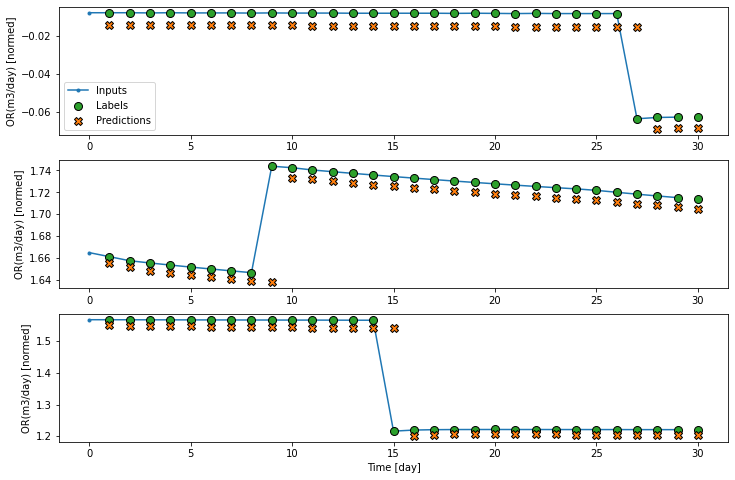

In [ ]:
wide_window.plot(dense_model , plot_col='OR(m3/day)')

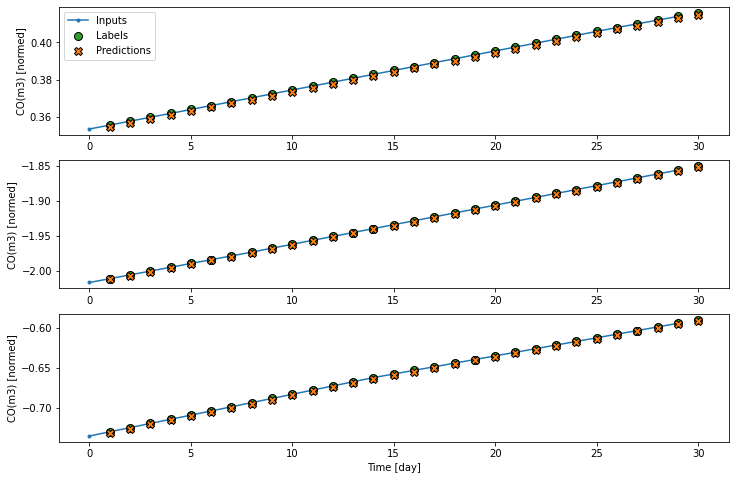

In [ ]:
wide_window.plot(dense_model , plot_col='CO(m3)')

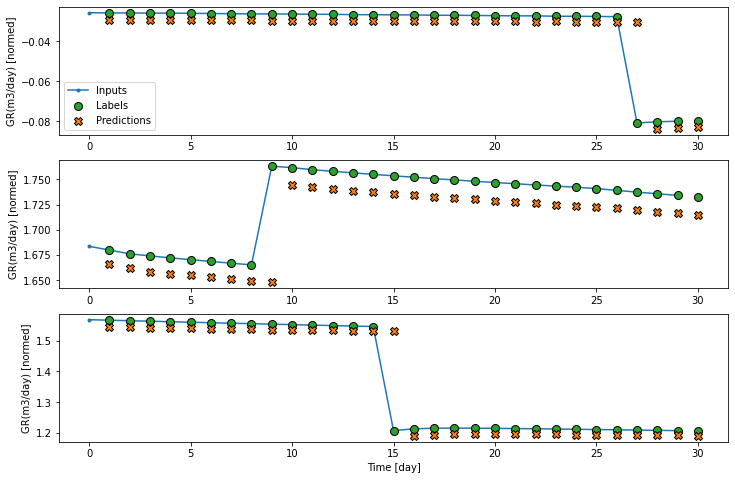

In [ ]:
wide_window.plot(dense_model , plot_col='GR(m3/day)')

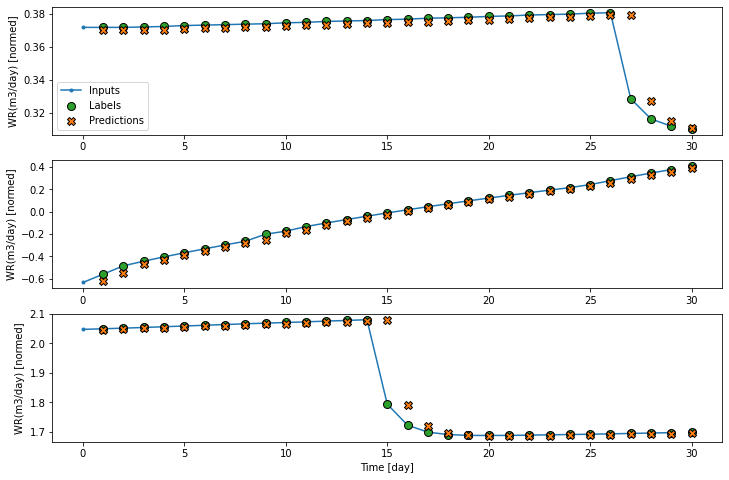

In [ ]:
wide_window.plot(dense_model , plot_col='WR(m3/day)')

***LSTM***

In [ ]:
# This returns a multi-layer-perceptron model in Keras.
def get_keras_model(num_hidden_layers,
                    num_neurons_per_layer,
                    activation):
    # create the MLP model.

    # define the layers.
    inputs = tf.keras.Input(shape=(30,8))  # input layer.

    # Add the hidden layers.
    for i in range(num_hidden_layers):
        x= layers.LSTM(num_neurons_per_layer, activation=activation ,return_sequences=True)(inputs)

    # output layer.
    outputs = layers.Dense(num_features)(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model


# This function takes in the hyperparameters and returns a score (Cross validation).
def keras_mlp_cv_score(parameterization, weight=None):

    model = get_keras_model(parameterization.get('num_hidden_layers'),
                            parameterization.get('neurons_per_layer'),
                            parameterization.get('activation'))

    opt = parameterization.get('optimizer')
    opt = opt.lower()

    learning_rate = parameterization.get('learning_rate')

    if opt == 'Nadam':
        optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif opt == 'rms':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    NUM_EPOCHS = 50

    # Specify the training configuration.
    model.compile(optimizer=optimizer,
                  loss=tf.keras.losses.MeanSquaredError(),
                  metrics=[tf.metrics.MeanAbsoluteError()])

    data = wide_window.train
    # fit the model using a 20% validation set.
    res = model.fit(data, epochs=NUM_EPOCHS, batch_size=parameterization.get('batch_size'),
                    validation_data=wide_window.val)

    # look at the last 10 epochs. Get the mean and standard deviation of the validation score.
    last10_scores = np.array(res.history['val_loss'][-10:])
    mean = last10_scores.mean()
    sem = last10_scores.std()

    # If the model didn't converge then set a high loss.
    if np.isnan(mean):
        return 9999.0, 0.0

    return mean, sem

In [ ]:
# Define the search space.
parameters=[
    {
        "name": "learning_rate",
        "type": "range",
        "bounds": [0.0001, 0.5],
        "log_scale": True,
    },
    {
        "name": "num_hidden_layers",
        "type": "range",
        "bounds": [1, 10],
        "value_type": "int"
    },
    {
        "name": "neurons_per_layer",
        "type": "range",
        "bounds": [1, 300],
        "value_type": "int"
    },
    {
        "name": "batch_size",
        "type": "choice",
        "values": [8, 16, 32, 64, 128, 256],
    },

    {
        "name": "activation",
        "type": "choice",
        "values": ['tanh','linear','relu'],
    },
    {
        "name": "optimizer",
        "type": "choice",
        "values": ['Nadam', 'rms', 'Adam'],
    },
]

In [ ]:
# import more packages
from ax.service.ax_client import AxClient
from ax.utils.notebook.plotting import render, init_notebook_plotting

init_notebook_plotting()

ax_client = AxClient()

# create the experiment.
ax_client.create_experiment(
    name="keras_experiment",
    parameters=parameters,
    objective_name='keras_cv',
    minimize=True)

def evaluate(parameters):
    return {"keras_cv": keras_mlp_cv_score(parameters)}

# Based on the search space, this will use Sobol (https://en.wikipedia.org/wiki/Sobol_sequence) instead of a Guassian Process (GPEI).
#
# From the source code:
#     """We should use only Sobol and not GPEI if:
#     1. there are less continuous parameters in the search space than the sum of
#     options for the choice parameters,
#     2. the number of total iterations in the optimization is known in advance and
#     there are less distinct points in the search space than the known intended
#     number of total iterations.
#     """

# Sobol sequences seem to be better than random for high-dimensional spaces:
# https://en.wikipedia.org/wiki/Quasi-Monte_Carlo_method

[INFO 06-27 13:00:48] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


[INFO 06-27 13:00:48] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 2 decimal points.
[INFO 06-27 13:00:48] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter learning_rate. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-27 13:00:48] ax.service.utils.instantiation: Inferred value type of ParameterType.INT for parameter batch_size. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-27 13:00:48] ax.service.utils.instantiation: Inferred value type of ParameterType.STRING for parameter activation. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-2

In [ ]:
for i in range(25):
    parameters, trial_index = ax_client.get_next_trial()
    ax_client.complete_trial(trial_index=trial_index, raw_data=evaluate(parameters))

[INFO 06-27 13:01:10] ax.service.ax_client: Generated new trial 0 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 2, 'neurons_per_layer': 23, 'batch_size': 128, 'activation': 'linear', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 4s 50ms/step - loss: 0.2489 - mean_absolute_error: 0.3061 - val_loss: 0.6809 - val_mean_absolute_error: 0.5947
Epoch 2/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0449 - mean_absolute_error: 0.1238 - val_loss: 0.2475 - val_mean_absolute_error: 0.3282
Epoch 3/50
49/49 [==============================] - 2s 47ms/step - loss: 0.0223 - mean_absolute_error: 0.0835 - val_loss: 0.1759 - val_mean_absolute_error: 0.2853
Epoch 4/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0145 - mean_absolute_error: 0.0671 - val_loss: 0.1636 - val_mean_absolute_error: 0.2865
Epoch 5/50
49/49 [==============================] - 2s 47ms/step - loss: 0.0100 - mean_absolute_error: 0.0545 - val_loss: 0.1407 - val_mean_absolute_error: 0.2604
Epoch 6/50
49/49 [==============================] - 2s 46ms/step - loss: 0.0085 - mean_absolute_error: 0.0489 - val_loss: 0.1100 - val_mean_absolute_error: 0.2215
Epoch 7/50
49/49 [====

[INFO 06-27 13:03:13] ax.service.ax_client: Completed trial 0 with data: {'keras_cv': (0.19, 0.2)}.
[INFO 06-27 13:03:13] ax.service.ax_client: Generated new trial 1 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 2, 'neurons_per_layer': 140, 'batch_size': 16, 'activation': 'linear', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 4s 53ms/step - loss: 0.3629 - mean_absolute_error: 0.4253 - val_loss: 0.6918 - val_mean_absolute_error: 0.6420
Epoch 2/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0981 - mean_absolute_error: 0.1705 - val_loss: 0.5211 - val_mean_absolute_error: 0.4913
Epoch 3/50
49/49 [==============================] - 2s 47ms/step - loss: 0.0700 - mean_absolute_error: 0.1307 - val_loss: 1.0312 - val_mean_absolute_error: 0.5654
Epoch 4/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0554 - mean_absolute_error: 0.1094 - val_loss: 0.5381 - val_mean_absolute_error: 0.4499
Epoch 5/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0456 - mean_absolute_error: 0.0948 - val_loss: 0.3288 - val_mean_absolute_error: 0.3655
Epoch 6/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0384 - mean_absolute_error: 0.0834 - val_loss: 0.2420 - val_mean_absolute_error: 0.3160
Epoch 7/50
49/49 [====

[INFO 06-27 13:05:23] ax.service.ax_client: Completed trial 1 with data: {'keras_cv': (0.08, 0.0)}.
[INFO 06-27 13:05:23] ax.service.ax_client: Generated new trial 2 with parameters {'learning_rate': 0.01, 'num_hidden_layers': 10, 'neurons_per_layer': 17, 'batch_size': 128, 'activation': 'tanh', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 5s 14ms/step - loss: 0.1334 - mean_absolute_error: 0.2114 - val_loss: 0.8054 - val_mean_absolute_error: 0.7006
Epoch 2/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0141 - mean_absolute_error: 0.0600 - val_loss: 0.5897 - val_mean_absolute_error: 0.5369
Epoch 3/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0085 - mean_absolute_error: 0.0410 - val_loss: 0.5148 - val_mean_absolute_error: 0.4913
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0066 - mean_absolute_error: 0.0335 - val_loss: 0.4802 - val_mean_absolute_error: 0.4698
Epoch 5/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0056 - mean_absolute_error: 0.0293 - val_loss: 0.4650 - val_mean_absolute_error: 0.4610
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0051 - mean_absolute_error: 0.0266 - val_loss: 0.4501 - val_mean_absolute_error: 0.4532
Epoch 7/50
49/49 [=========

[INFO 06-27 13:05:58] ax.service.ax_client: Completed trial 2 with data: {'keras_cv': (0.36, 0.01)}.
[INFO 06-27 13:05:58] ax.service.ax_client: Generated new trial 3 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 5, 'neurons_per_layer': 183, 'batch_size': 8, 'activation': 'relu', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 4s 53ms/step - loss: 0.5094 - mean_absolute_error: 0.5445 - val_loss: 1.0814 - val_mean_absolute_error: 0.8235
Epoch 2/50
49/49 [==============================] - 2s 46ms/step - loss: 0.1390 - mean_absolute_error: 0.2259 - val_loss: 0.8548 - val_mean_absolute_error: 0.6446
Epoch 3/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0860 - mean_absolute_error: 0.1489 - val_loss: 23.4232 - val_mean_absolute_error: 1.6951
Epoch 4/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0625 - mean_absolute_error: 0.1133 - val_loss: 3.1539 - val_mean_absolute_error: 0.8115
Epoch 5/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0490 - mean_absolute_error: 0.0930 - val_loss: 1.0145 - val_mean_absolute_error: 0.5686
Epoch 6/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0400 - mean_absolute_error: 0.0798 - val_loss: 0.4574 - val_mean_absolute_error: 0.4250
Epoch 7/50
49/49 [===

[INFO 06-27 13:08:07] ax.service.ax_client: Completed trial 3 with data: {'keras_cv': (0.07, 0.0)}.
[INFO 06-27 13:08:07] ax.service.ax_client: Generated new trial 4 with parameters {'learning_rate': 0.19, 'num_hidden_layers': 10, 'neurons_per_layer': 18, 'batch_size': 128, 'activation': 'tanh', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 2s 22ms/step - loss: 0.4216 - mean_absolute_error: 0.3442 - val_loss: 1.0534 - val_mean_absolute_error: 0.7664
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.1044 - mean_absolute_error: 0.2385 - val_loss: 0.7789 - val_mean_absolute_error: 0.6694
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0797 - mean_absolute_error: 0.2144 - val_loss: 0.4001 - val_mean_absolute_error: 0.4766
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0686 - mean_absolute_error: 0.1932 - val_loss: 0.4216 - val_mean_absolute_error: 0.5262
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0811 - mean_absolute_error: 0.2103 - val_loss: 0.7443 - val_mean_absolute_error: 0.5933
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0612 - mean_absolute_error: 0.1740 - val_loss: 1.3730 - val_mean_absolute_error: 0.8832
Epoch 7/50
49/49 [=========

[INFO 06-27 13:08:37] ax.service.ax_client: Completed trial 4 with data: {'keras_cv': (0.52, 0.21)}.
[INFO 06-27 13:08:37] ax.service.ax_client: Generated new trial 5 with parameters {'learning_rate': 0.07, 'num_hidden_layers': 7, 'neurons_per_layer': 254, 'batch_size': 8, 'activation': 'linear', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 4s 53ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 3/50
49/49 [==============================] - 2s 48ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 4/50
49/49 [==============================] - 2s 50ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 5/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 6/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 7/50
49/49 [==============================] - 2s 48ms/step - loss: nan - mean_absolute_e

[INFO 06-27 13:10:51] ax.service.ax_client: Completed trial 5 with data: {'keras_cv': (9999.0, 0.0)}.
[INFO 06-27 13:10:52] ax.service.ax_client: Generated new trial 6 with parameters {'learning_rate': 0.03, 'num_hidden_layers': 1, 'neurons_per_layer': 209, 'batch_size': 256, 'activation': 'linear', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 4s 54ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 3/50
49/49 [==============================] - 2s 47ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 4/50
49/49 [==============================] - 2s 48ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 5/50
49/49 [==============================] - 2s 50ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 6/50
49/49 [==============================] - 2s 48ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 7/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_e

[INFO 06-27 13:13:01] ax.service.ax_client: Completed trial 6 with data: {'keras_cv': (9999.0, 0.0)}.
[INFO 06-27 13:13:01] ax.service.ax_client: Generated new trial 7 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 1, 'neurons_per_layer': 220, 'batch_size': 64, 'activation': 'linear', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 4s 51ms/step - loss: 0.2875 - mean_absolute_error: 0.3738 - val_loss: 0.6638 - val_mean_absolute_error: 0.6242
Epoch 2/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0985 - mean_absolute_error: 0.1700 - val_loss: 0.3036 - val_mean_absolute_error: 0.3631
Epoch 3/50
49/49 [==============================] - 3s 51ms/step - loss: 0.0590 - mean_absolute_error: 0.1143 - val_loss: 0.2155 - val_mean_absolute_error: 0.2959
Epoch 4/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0409 - mean_absolute_error: 0.0889 - val_loss: 0.1711 - val_mean_absolute_error: 0.2614
Epoch 5/50
49/49 [==============================] - 2s 50ms/step - loss: 0.0305 - mean_absolute_error: 0.0735 - val_loss: 0.1484 - val_mean_absolute_error: 0.2509
Epoch 6/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0237 - mean_absolute_error: 0.0629 - val_loss: 0.1220 - val_mean_absolute_error: 0.2083
Epoch 7/50
49/49 [====

[INFO 06-27 13:15:12] ax.service.ax_client: Completed trial 7 with data: {'keras_cv': (0.04, 0.0)}.
[INFO 06-27 13:15:12] ax.service.ax_client: Generated new trial 8 with parameters {'learning_rate': 0.01, 'num_hidden_layers': 5, 'neurons_per_layer': 208, 'batch_size': 256, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 4s 52ms/step - loss: 4812386598912.0000 - mean_absolute_error: 60652.6875 - val_loss: 0.4703 - val_mean_absolute_error: 0.4312
Epoch 2/50
49/49 [==============================] - 3s 50ms/step - loss: 0.1175 - mean_absolute_error: 0.1476 - val_loss: 0.5111 - val_mean_absolute_error: 0.4416
Epoch 3/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0338 - mean_absolute_error: 0.1019 - val_loss: 0.3092 - val_mean_absolute_error: 0.3489
Epoch 4/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0230 - mean_absolute_error: 0.0860 - val_loss: 0.2298 - val_mean_absolute_error: 0.3068
Epoch 5/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0176 - mean_absolute_error: 0.0716 - val_loss: 0.1546 - val_mean_absolute_error: 0.2483
Epoch 6/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0148 - mean_absolute_error: 0.0624 - val_loss: 0.2057 - val_mean_absolute_error: 0.3013
Epoch 

[INFO 06-27 13:17:33] ax.service.ax_client: Completed trial 8 with data: {'keras_cv': (8.18, 14.96)}.
[INFO 06-27 13:17:33] ax.service.ax_client: Generated new trial 9 with parameters {'learning_rate': 0.15, 'num_hidden_layers': 6, 'neurons_per_layer': 108, 'batch_size': 128, 'activation': 'tanh', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.7788 - mean_absolute_error: 0.4206 - val_loss: 1.0780 - val_mean_absolute_error: 0.8084
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0453 - mean_absolute_error: 0.1470 - val_loss: 0.8903 - val_mean_absolute_error: 0.6926
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0201 - mean_absolute_error: 0.0967 - val_loss: 0.8282 - val_mean_absolute_error: 0.5539
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0236 - mean_absolute_error: 0.1084 - val_loss: 1.0288 - val_mean_absolute_error: 0.6042
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0137 - mean_absolute_error: 0.0784 - val_loss: 0.7882 - val_mean_absolute_error: 0.5718
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0079 - mean_absolute_error: 0.0503 - val_loss: 0.7934 - val_mean_absolute_error: 0.5494
Epoch 7/50
49/49 [=========

[INFO 06-27 13:18:04] ax.service.ax_client: Completed trial 9 with data: {'keras_cv': (0.43, 0.03)}.
[INFO 06-27 13:18:04] ax.service.ax_client: Generated new trial 10 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 7, 'neurons_per_layer': 17, 'batch_size': 16, 'activation': 'tanh', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 1.0631 - mean_absolute_error: 0.8389 - val_loss: 2.4459 - val_mean_absolute_error: 1.2792
Epoch 2/50
49/49 [==============================] - 0s 7ms/step - loss: 0.8021 - mean_absolute_error: 0.7207 - val_loss: 2.1547 - val_mean_absolute_error: 1.2000
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.5835 - mean_absolute_error: 0.6007 - val_loss: 1.8796 - val_mean_absolute_error: 1.1119
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.4113 - mean_absolute_error: 0.4896 - val_loss: 1.6319 - val_mean_absolute_error: 1.0231
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.2897 - mean_absolute_error: 0.3985 - val_loss: 1.4192 - val_mean_absolute_error: 0.9553
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.2103 - mean_absolute_error: 0.3292 - val_loss: 1.3139 - val_mean_absolute_error: 0.9221
Epoch 7/50
49/49 [=========

[INFO 06-27 13:18:35] ax.service.ax_client: Completed trial 10 with data: {'keras_cv': (0.48, 0.01)}.
[INFO 06-27 13:18:35] ax.service.ax_client: Generated new trial 11 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 1, 'neurons_per_layer': 98, 'batch_size': 32, 'activation': 'tanh', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.1971 - mean_absolute_error: 0.2893 - val_loss: 0.7543 - val_mean_absolute_error: 0.6887
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0556 - mean_absolute_error: 0.1156 - val_loss: 0.4636 - val_mean_absolute_error: 0.4809
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0385 - mean_absolute_error: 0.0868 - val_loss: 0.3895 - val_mean_absolute_error: 0.4228
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0294 - mean_absolute_error: 0.0723 - val_loss: 0.3714 - val_mean_absolute_error: 0.4133
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0236 - mean_absolute_error: 0.0623 - val_loss: 0.3553 - val_mean_absolute_error: 0.4016
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0196 - mean_absolute_error: 0.0553 - val_loss: 0.3442 - val_mean_absolute_error: 0.3943
Epoch 7/50
49/49 [=========

[INFO 06-27 13:19:05] ax.service.ax_client: Completed trial 11 with data: {'keras_cv': (0.11, 0.01)}.
[INFO 06-27 13:19:05] ax.service.ax_client: Generated new trial 12 with parameters {'learning_rate': 0.34, 'num_hidden_layers': 4, 'neurons_per_layer': 182, 'batch_size': 32, 'activation': 'tanh', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 15.4492 - mean_absolute_error: 2.4911 - val_loss: 7.0556 - val_mean_absolute_error: 1.8702
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 5.5425 - mean_absolute_error: 1.7754 - val_loss: 11.1993 - val_mean_absolute_error: 2.4782
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.9516 - mean_absolute_error: 0.7220 - val_loss: 4.2966 - val_mean_absolute_error: 1.4178
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.3230 - mean_absolute_error: 0.4111 - val_loss: 3.8428 - val_mean_absolute_error: 1.3747
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.1531 - mean_absolute_error: 0.2715 - val_loss: 2.1377 - val_mean_absolute_error: 0.9203
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0920 - mean_absolute_error: 0.2176 - val_loss: 1.8510 - val_mean_absolute_error: 0.9276
Epoch 7/50
49/49 [=======

[INFO 06-27 13:19:35] ax.service.ax_client: Completed trial 12 with data: {'keras_cv': (1.89, 1.73)}.
[INFO 06-27 13:19:36] ax.service.ax_client: Generated new trial 13 with parameters {'learning_rate': 0.01, 'num_hidden_layers': 7, 'neurons_per_layer': 151, 'batch_size': 256, 'activation': 'linear', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 4s 53ms/step - loss: 0.5415 - mean_absolute_error: 0.2791 - val_loss: 0.2500 - val_mean_absolute_error: 0.3509
Epoch 2/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0322 - mean_absolute_error: 0.0858 - val_loss: 0.1748 - val_mean_absolute_error: 0.2762
Epoch 3/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0209 - mean_absolute_error: 0.0622 - val_loss: 0.1381 - val_mean_absolute_error: 0.2422
Epoch 4/50
49/49 [==============================] - 2s 50ms/step - loss: 0.0151 - mean_absolute_error: 0.0505 - val_loss: 0.1095 - val_mean_absolute_error: 0.2094
Epoch 5/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0117 - mean_absolute_error: 0.0430 - val_loss: 0.0940 - val_mean_absolute_error: 0.1904
Epoch 6/50
49/49 [==============================] - 2s 51ms/step - loss: 0.0095 - mean_absolute_error: 0.0376 - val_loss: 0.0847 - val_mean_absolute_error: 0.1774
Epoch 7/50
49/49 [====

[INFO 06-27 13:21:56] ax.service.ax_client: Completed trial 13 with data: {'keras_cv': (0.02, 0.0)}.
[INFO 06-27 13:21:56] ax.service.ax_client: Generated new trial 14 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 119, 'batch_size': 64, 'activation': 'tanh', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.1679 - mean_absolute_error: 0.2413 - val_loss: 0.4739 - val_mean_absolute_error: 0.5190
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0400 - mean_absolute_error: 0.0957 - val_loss: 0.3285 - val_mean_absolute_error: 0.3892
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0223 - mean_absolute_error: 0.0704 - val_loss: 0.2912 - val_mean_absolute_error: 0.3649
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0150 - mean_absolute_error: 0.0574 - val_loss: 0.2554 - val_mean_absolute_error: 0.3348
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0109 - mean_absolute_error: 0.0486 - val_loss: 0.2404 - val_mean_absolute_error: 0.3275
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0087 - mean_absolute_error: 0.0432 - val_loss: 0.2086 - val_mean_absolute_error: 0.3024
Epoch 7/50
49/49 [=========

[INFO 06-27 13:22:27] ax.service.ax_client: Completed trial 14 with data: {'keras_cv': (0.07, 0.0)}.
[INFO 06-27 13:22:27] ax.service.ax_client: Generated new trial 15 with parameters {'learning_rate': 0.04, 'num_hidden_layers': 7, 'neurons_per_layer': 188, 'batch_size': 64, 'activation': 'linear', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 4s 54ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 3/50
49/49 [==============================] - 2s 50ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 4/50
49/49 [==============================] - 2s 50ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 5/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 6/50
49/49 [==============================] - 2s 50ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 7/50
49/49 [==============================] - 2s 48ms/step - loss: nan - mean_absolute_e

[INFO 06-27 13:24:48] ax.service.ax_client: Completed trial 15 with data: {'keras_cv': (9999.0, 0.0)}.
[INFO 06-27 13:24:48] ax.service.ax_client: Generated new trial 16 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 5, 'neurons_per_layer': 60, 'batch_size': 128, 'activation': 'linear', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 4s 52ms/step - loss: 0.1525 - mean_absolute_error: 0.2298 - val_loss: 0.3448 - val_mean_absolute_error: 0.4206
Epoch 2/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0314 - mean_absolute_error: 0.0795 - val_loss: 0.1971 - val_mean_absolute_error: 0.3019
Epoch 3/50
49/49 [==============================] - 2s 46ms/step - loss: 0.0198 - mean_absolute_error: 0.0579 - val_loss: 0.1656 - val_mean_absolute_error: 0.2714
Epoch 4/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0140 - mean_absolute_error: 0.0471 - val_loss: 0.1496 - val_mean_absolute_error: 0.2594
Epoch 5/50
49/49 [==============================] - 2s 46ms/step - loss: 0.0105 - mean_absolute_error: 0.0400 - val_loss: 0.1347 - val_mean_absolute_error: 0.2479
Epoch 6/50
49/49 [==============================] - 2s 46ms/step - loss: 0.0083 - mean_absolute_error: 0.0343 - val_loss: 0.1273 - val_mean_absolute_error: 0.2408
Epoch 7/50
49/49 [====

[INFO 06-27 13:26:53] ax.service.ax_client: Completed trial 16 with data: {'keras_cv': (0.03, 0.0)}.
[INFO 06-27 13:26:53] ax.service.ax_client: Generated new trial 17 with parameters {'learning_rate': 0.17, 'num_hidden_layers': 7, 'neurons_per_layer': 275, 'batch_size': 128, 'activation': 'relu', 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 4s 54ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 2/50
49/49 [==============================] - 3s 51ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 3/50
49/49 [==============================] - 3s 51ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 4/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 5/50
49/49 [==============================] - 3s 50ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 6/50
49/49 [==============================] - 3s 51ms/step - loss: nan - mean_absolute_error: nan - val_loss: nan - val_mean_absolute_error: nan
Epoch 7/50
49/49 [==============================] - 2s 49ms/step - loss: nan - mean_absolute_e

[INFO 06-27 13:29:30] ax.service.ax_client: Completed trial 17 with data: {'keras_cv': (9999.0, 0.0)}.
[INFO 06-27 13:29:31] ax.service.ax_client: Generated new trial 18 with parameters {'learning_rate': 0.01, 'num_hidden_layers': 4, 'neurons_per_layer': 173, 'batch_size': 32, 'activation': 'tanh', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.0694 - mean_absolute_error: 0.1420 - val_loss: 0.2517 - val_mean_absolute_error: 0.3390
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0101 - mean_absolute_error: 0.0426 - val_loss: 0.1974 - val_mean_absolute_error: 0.2933
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0067 - mean_absolute_error: 0.0292 - val_loss: 0.1674 - val_mean_absolute_error: 0.2708
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0052 - mean_absolute_error: 0.0236 - val_loss: 0.1450 - val_mean_absolute_error: 0.2522
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0046 - mean_absolute_error: 0.0232 - val_loss: 0.1361 - val_mean_absolute_error: 0.2555
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0043 - mean_absolute_error: 0.0208 - val_loss: 0.1154 - val_mean_absolute_error: 0.2271
Epoch 7/50
49/49 [=========

[INFO 06-27 13:30:00] ax.service.ax_client: Completed trial 18 with data: {'keras_cv': (0.06, 0.0)}.
[INFO 06-27 13:30:00] ax.service.ax_client: Generated new trial 19 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 5, 'neurons_per_layer': 207, 'batch_size': 8, 'activation': 'linear', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 4s 52ms/step - loss: 0.1058 - mean_absolute_error: 0.1748 - val_loss: 0.1581 - val_mean_absolute_error: 0.2434
Epoch 2/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0268 - mean_absolute_error: 0.0673 - val_loss: 0.1069 - val_mean_absolute_error: 0.1854
Epoch 3/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0174 - mean_absolute_error: 0.0505 - val_loss: 0.0899 - val_mean_absolute_error: 0.1691
Epoch 4/50
49/49 [==============================] - 2s 50ms/step - loss: 0.0120 - mean_absolute_error: 0.0397 - val_loss: 0.0826 - val_mean_absolute_error: 0.1704
Epoch 5/50
49/49 [==============================] - 2s 50ms/step - loss: 0.0089 - mean_absolute_error: 0.0336 - val_loss: 0.0767 - val_mean_absolute_error: 0.1685
Epoch 6/50
49/49 [==============================] - 3s 52ms/step - loss: 0.0069 - mean_absolute_error: 0.0282 - val_loss: 0.0710 - val_mean_absolute_error: 0.1640
Epoch 7/50
49/49 [====

[INFO 06-27 13:32:31] ax.service.ax_client: Completed trial 19 with data: {'keras_cv': (0.02, 0.0)}.
[INFO 06-27 13:32:32] ax.service.ax_client: Generated new trial 20 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 8, 'neurons_per_layer': 217, 'batch_size': 64, 'activation': 'tanh', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.0871 - mean_absolute_error: 0.1605 - val_loss: 0.2343 - val_mean_absolute_error: 0.3154
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0176 - mean_absolute_error: 0.0544 - val_loss: 0.1835 - val_mean_absolute_error: 0.2764
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0113 - mean_absolute_error: 0.0406 - val_loss: 0.1496 - val_mean_absolute_error: 0.2447
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0081 - mean_absolute_error: 0.0330 - val_loss: 0.1306 - val_mean_absolute_error: 0.2277
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0062 - mean_absolute_error: 0.0273 - val_loss: 0.1176 - val_mean_absolute_error: 0.2159
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0052 - mean_absolute_error: 0.0229 - val_loss: 0.1034 - val_mean_absolute_error: 0.1999
Epoch 7/50
49/49 [=========

[INFO 06-27 13:33:04] ax.service.ax_client: Completed trial 20 with data: {'keras_cv': (0.04, 0.0)}.
[INFO 06-27 13:33:04] ax.service.ax_client: Generated new trial 21 with parameters {'learning_rate': 0.22, 'num_hidden_layers': 3, 'neurons_per_layer': 4, 'batch_size': 64, 'activation': 'tanh', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 24ms/step - loss: 0.1795 - mean_absolute_error: 0.2644 - val_loss: 1.1430 - val_mean_absolute_error: 0.8953
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0338 - mean_absolute_error: 0.1164 - val_loss: 1.0965 - val_mean_absolute_error: 0.8714
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0248 - mean_absolute_error: 0.0972 - val_loss: 1.1774 - val_mean_absolute_error: 0.9042
Epoch 4/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0253 - mean_absolute_error: 0.0994 - val_loss: 1.0826 - val_mean_absolute_error: 0.8534
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0223 - mean_absolute_error: 0.0915 - val_loss: 1.0553 - val_mean_absolute_error: 0.8582
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0210 - mean_absolute_error: 0.0865 - val_loss: 1.1176 - val_mean_absolute_error: 0.8955
Epoch 7/50
49/49 [=========

[INFO 06-27 13:33:34] ax.service.ax_client: Completed trial 21 with data: {'keras_cv': (1.04, 0.09)}.
[INFO 06-27 13:33:34] ax.service.ax_client: Generated new trial 22 with parameters {'learning_rate': 0.01, 'num_hidden_layers': 7, 'neurons_per_layer': 205, 'batch_size': 32, 'activation': 'linear', 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 4s 54ms/step - loss: 0.1283 - mean_absolute_error: 0.1989 - val_loss: 0.1601 - val_mean_absolute_error: 0.2560
Epoch 2/50
49/49 [==============================] - 2s 50ms/step - loss: 0.0170 - mean_absolute_error: 0.0552 - val_loss: 0.1121 - val_mean_absolute_error: 0.2061
Epoch 3/50
49/49 [==============================] - 3s 51ms/step - loss: 0.0113 - mean_absolute_error: 0.0420 - val_loss: 0.1059 - val_mean_absolute_error: 0.2111
Epoch 4/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0082 - mean_absolute_error: 0.0338 - val_loss: 0.0904 - val_mean_absolute_error: 0.1903
Epoch 5/50
49/49 [==============================] - 3s 51ms/step - loss: 0.0065 - mean_absolute_error: 0.0281 - val_loss: 0.0863 - val_mean_absolute_error: 0.1863
Epoch 6/50
49/49 [==============================] - 3s 54ms/step - loss: 0.0055 - mean_absolute_error: 0.0244 - val_loss: 0.0774 - val_mean_absolute_error: 0.1769
Epoch 7/50
49/49 [====

[INFO 06-27 13:36:04] ax.service.ax_client: Completed trial 22 with data: {'keras_cv': (0.01, 0.0)}.
[INFO 06-27 13:36:04] ax.service.ax_client: Generated new trial 23 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 238, 'batch_size': 32, 'activation': 'relu', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 4s 56ms/step - loss: 0.3697 - mean_absolute_error: 0.3487 - val_loss: 0.4728 - val_mean_absolute_error: 0.5200
Epoch 2/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0643 - mean_absolute_error: 0.1206 - val_loss: 0.1794 - val_mean_absolute_error: 0.2623
Epoch 3/50
49/49 [==============================] - 3s 51ms/step - loss: 0.0342 - mean_absolute_error: 0.0739 - val_loss: 0.1390 - val_mean_absolute_error: 0.2300
Epoch 4/50
49/49 [==============================] - 3s 53ms/step - loss: 0.0216 - mean_absolute_error: 0.0545 - val_loss: 0.1201 - val_mean_absolute_error: 0.2262
Epoch 5/50
49/49 [==============================] - 3s 53ms/step - loss: 0.0144 - mean_absolute_error: 0.0417 - val_loss: 0.1072 - val_mean_absolute_error: 0.2122
Epoch 6/50
49/49 [==============================] - 3s 52ms/step - loss: 0.0101 - mean_absolute_error: 0.0337 - val_loss: 0.1020 - val_mean_absolute_error: 0.2113
Epoch 7/50
49/49 [====

[INFO 06-27 13:38:57] ax.service.ax_client: Completed trial 23 with data: {'keras_cv': (0.05, 0.0)}.
[INFO 06-27 13:38:58] ax.service.ax_client: Generated new trial 24 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 1, 'neurons_per_layer': 47, 'batch_size': 256, 'activation': 'tanh', 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.5357 - mean_absolute_error: 0.5762 - val_loss: 1.4281 - val_mean_absolute_error: 0.9321
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.1475 - mean_absolute_error: 0.2562 - val_loss: 1.1561 - val_mean_absolute_error: 0.8251
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0763 - mean_absolute_error: 0.1592 - val_loss: 1.0597 - val_mean_absolute_error: 0.7772
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0587 - mean_absolute_error: 0.1305 - val_loss: 0.9704 - val_mean_absolute_error: 0.7341
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0484 - mean_absolute_error: 0.1136 - val_loss: 0.8829 - val_mean_absolute_error: 0.6920
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0407 - mean_absolute_error: 0.1009 - val_loss: 0.7844 - val_mean_absolute_error: 0.6445
Epoch 7/50
49/49 [=========

[INFO 06-27 13:39:27] ax.service.ax_client: Completed trial 24 with data: {'keras_cv': (0.31, 0.01)}.


In [ ]:
# look at all the trials.
ax_client.get_trials_data_frame().sort_values('trial_index')

,keras_cv,trial_index,arm_name,learning_rate,num_hidden_layers,neurons_per_layer,batch_size,activation,optimizer
0,0.191505,0,0_0,0.003670,2,23,128,linear,rms
3,0.081177,1,1_0,0.000362,2,140,16,linear,Adam
15,0.362851,2,2_0,0.013498,10,17,128,tanh,Adam
18,0.068779,3,3_0,0.000300,5,183,8,relu,Adam
19,0.515620,4,4_0,0.186163,10,18,128,tanh,rms
20,9999.000000,5,5_0,0.069266,7,254,8,linear,Nadam
21,9999.000000,6,6_0,0.032540,1,209,256,linear,Adam
22,0.044206,7,7_0,0.000146,1,220,64,linear,rms
23,8.181647,8,8_0,0.007293,5,208,256,relu,rms
24,0.432987,9,9_0,0.153219,6,108,128,tanh,Adam


In [ ]:
best_parameters, values = ax_client.get_best_parameters()

# the best set of parameters.
for k in best_parameters.items():
  print(k)

print()

# the best score achieved.
means, covariances = values
print(means)

('learning_rate', 0.005191191694211205)
('num_hidden_layers', 7)
('neurons_per_layer', 205)
('batch_size', 32)
('activation', 'linear')
('optimizer', 'Nadam')

{'keras_cv': 0.008943582093343139}


In [ ]:
%%time
# train the model on the full training set and test.
lstm_model = get_keras_model(best_parameters['num_hidden_layers'],
                              best_parameters['neurons_per_layer'],
                              best_parameters['activation'])

opt = best_parameters['optimizer']
opt = opt.lower()

learning_rate = best_parameters['learning_rate']

if opt == 'Nadam':
    optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
elif opt == 'rms':
    optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
else:
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

NUM_EPOCHS = 50

# Specify the training configuration.
lstm_model.compile(optimizer=optimizer,
              loss=tf.keras.losses.MeanSquaredError(),
              metrics=[tf.metrics.MeanAbsoluteError()])

data = wide_window.train
res = lstm_model.fit(data, epochs=NUM_EPOCHS, batch_size=best_parameters['batch_size'],validation_data=wide_window.val)
print()

Epoch 1/50
49/49 [==============================] - 4s 52ms/step - loss: 0.2917 - mean_absolute_error: 0.2518 - val_loss: 0.2178 - val_mean_absolute_error: 0.2972
Epoch 2/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0300 - mean_absolute_error: 0.0800 - val_loss: 0.1803 - val_mean_absolute_error: 0.2837
Epoch 3/50
49/49 [==============================] - 2s 50ms/step - loss: 0.0197 - mean_absolute_error: 0.0607 - val_loss: 0.1374 - val_mean_absolute_error: 0.2395
Epoch 4/50
49/49 [==============================] - 2s 49ms/step - loss: 0.0144 - mean_absolute_error: 0.0504 - val_loss: 0.1185 - val_mean_absolute_error: 0.2231
Epoch 5/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0111 - mean_absolute_error: 0.0425 - val_loss: 0.1054 - val_mean_absolute_error: 0.2060
Epoch 6/50
49/49 [==============================] - 2s 48ms/step - loss: 0.0088 - mean_absolute_error: 0.0360 - val_loss: 0.0980 - val_mean_absolute_error: 0.1948
Epoch 7/50
49/49 [====

In [ ]:
# Use the model to predict the test values.
performance['lstm'] = lstm_model.evaluate(wide_window.test)

7/7 [==============================] - 0s 6ms/step - loss: 0.2960 - mean_absolute_error: 0.4250


In [ ]:
val_performance['lstm'] = lstm_model.evaluate(wide_window.val)

14/14 [==============================] - 0s 6ms/step - loss: 0.0158 - mean_absolute_error: 0.0788


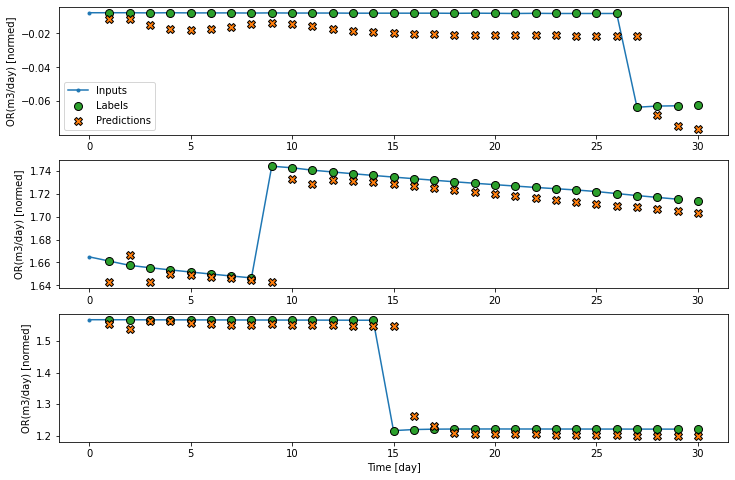

In [ ]:
wide_window.plot(lstm_model , plot_col='OR(m3/day)')

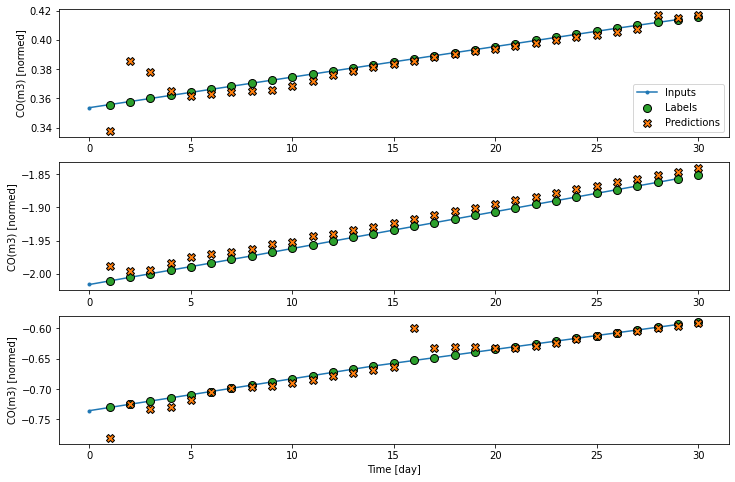

In [ ]:
wide_window.plot(lstm_model , plot_col='CO(m3)')

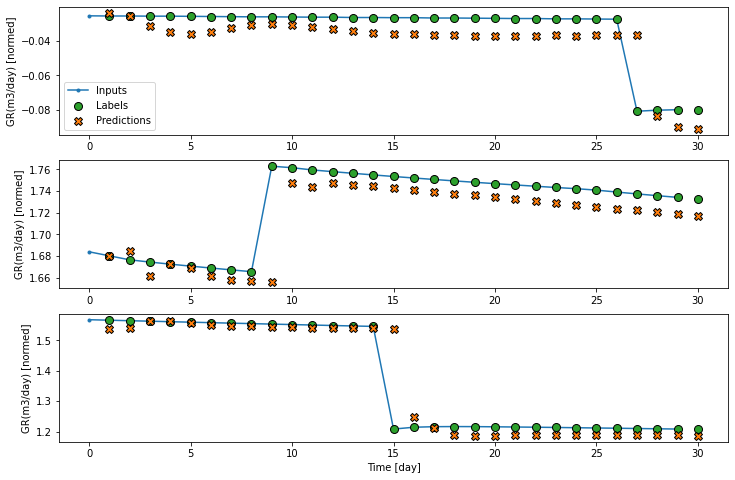

In [ ]:
wide_window.plot(lstm_model , plot_col='GR(m3/day)')

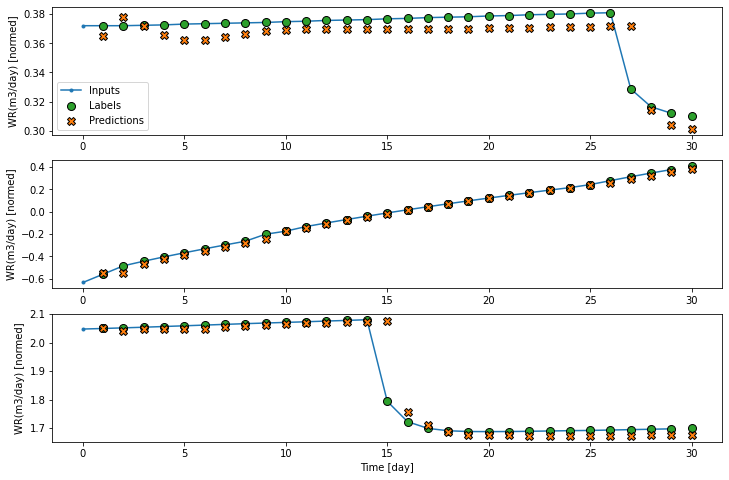

In [ ]:
wide_window.plot(lstm_model , plot_col='WR(m3/day)')

***ResLSTM***

In [ ]:
class ResidualWrapper(tf.keras.Model):
  def __init__(self, model):
    super().__init__()
    self.model = model

  def call(self, inputs, *args, **kwargs):
    delta = self.model(inputs, *args, **kwargs)

    # The prediction for each timestep is the input
    # from the previous time step plus the delta
    # calculated by the model.
    return inputs + delta

In [ ]:
# This returns a multi-layer-perceptron model in Keras.
def get_keras_model(num_hidden_layers,
                    num_neurons_per_layer):
    # create the MLP model.

    # define the layers.
    inputs = tf.keras.Input(shape=(30,8))  # input layer.

    # Add the hidden layers.
    for i in range(num_hidden_layers):
        x= layers.LSTM(num_neurons_per_layer,return_sequences=True)(inputs)

    # output layer.
    outputs = layers.Dense(num_features,kernel_initializer=tf.initializers.zeros())(x)

    model = ResidualWrapper(tf.keras.Model(inputs=inputs, outputs=outputs))
    return model


# This function takes in the hyperparameters and returns a score (Cross validation).
def keras_mlp_cv_score(parameterization, weight=None):

    model = get_keras_model(parameterization.get('num_hidden_layers'),
                            parameterization.get('neurons_per_layer'))

    opt = parameterization.get('optimizer')
    opt = opt.lower()

    learning_rate = parameterization.get('learning_rate')

    if opt == 'Nadam':
        optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
    elif opt == 'rms':
        optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    NUM_EPOCHS = 50

    # Specify the training configuration.
    model.compile(optimizer=optimizer,
                  loss=tf.keras.losses.MeanSquaredError(),
                  metrics=[tf.metrics.MeanAbsoluteError()])

    data = wide_window.train
    # fit the model using a 20% validation set.
    res = model.fit(data, epochs=NUM_EPOCHS, batch_size=parameterization.get('batch_size'),
                    validation_data=wide_window.val)

    # look at the last 10 epochs. Get the mean and standard deviation of the validation score.
    last10_scores = np.array(res.history['val_loss'][-10:])
    mean = last10_scores.mean()
    sem = last10_scores.std()

    # If the model didn't converge then set a high loss.
    if np.isnan(mean):
        return 9999.0, 0.0

    return mean, sem

In [ ]:
# Define the search space.
parameters=[
    {
        "name": "learning_rate",
        "type": "range",
        "bounds": [0.0001, 0.5],
        "log_scale": True,
    },
    {
        "name": "num_hidden_layers",
        "type": "range",
        "bounds": [1, 10],
        "value_type": "int"
    },
    {
        "name": "neurons_per_layer",
        "type": "range",
        "bounds": [1, 300],
        "value_type": "int"
    },
    {
        "name": "batch_size",
        "type": "choice",
        "values": [8, 16, 32, 64, 128, 256],
    },
    {
        "name": "optimizer",
        "type": "choice",
        "values": ['Nadam', 'rms', 'Adam'],
    },
]

In [ ]:
# import more packages
from ax.service.ax_client import AxClient
from ax.utils.notebook.plotting import render, init_notebook_plotting

init_notebook_plotting()

ax_client = AxClient()

# create the experiment.
ax_client.create_experiment(
    name="keras_experiment",
    parameters=parameters,
    objective_name='keras_cv',
    minimize=True)

def evaluate(parameters):
    return {"keras_cv": keras_mlp_cv_score(parameters)}

# Based on the search space, this will use Sobol (https://en.wikipedia.org/wiki/Sobol_sequence) instead of a Guassian Process (GPEI).
#
# From the source code:
#     """We should use only Sobol and not GPEI if:
#     1. there are less continuous parameters in the search space than the sum of
#     options for the choice parameters,
#     2. the number of total iterations in the optimization is known in advance and
#     there are less distinct points in the search space than the known intended
#     number of total iterations.
#     """

# Sobol sequences seem to be better than random for high-dimensional spaces:
# https://en.wikipedia.org/wiki/Quasi-Monte_Carlo_method

[INFO 06-27 15:24:03] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.


[INFO 06-27 15:24:03] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 2 decimal points.
[INFO 06-27 15:24:03] ax.service.utils.instantiation: Inferred value type of ParameterType.FLOAT for parameter learning_rate. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-27 15:24:03] ax.service.utils.instantiation: Inferred value type of ParameterType.INT for parameter batch_size. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-27 15:24:03] ax.service.utils.instantiation: Inferred value type of ParameterType.STRING for parameter optimizer. If that is not the expected value type, you can explicity specify 'value_type' ('int', 'float', 'bool' or 'str') in parameter dict.
[INFO 06-27

In [ ]:
for i in range(25):
    parameters, trial_index = ax_client.get_next_trial()
    ax_client.complete_trial(trial_index=trial_index, raw_data=evaluate(parameters))

[INFO 06-27 15:24:10] ax.service.ax_client: Generated new trial 0 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 7, 'neurons_per_layer': 245, 'batch_size': 256, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.0035 - mean_absolute_error: 0.0084 - val_loss: 5.9503e-04 - val_mean_absolute_error: 0.0110
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0055 - val_loss: 5.3997e-04 - val_mean_absolute_error: 0.0082
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0055 - val_loss: 5.6360e-04 - val_mean_absolute_error: 0.0053
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0055 - val_loss: 6.1863e-04 - val_mean_absolute_error: 0.0106
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0060 - val_loss: 6.5688e-04 - val_mean_absolute_error: 0.0075
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0057 - val_loss: 6.6264e-04 - val_mean_absolute_error: 0.0075
Epo

[INFO 06-27 15:24:40] ax.service.ax_client: Completed trial 0 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:24:40] ax.service.ax_client: Generated new trial 1 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 108, 'batch_size': 64, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.0035 - mean_absolute_error: 0.0073 - val_loss: 5.4033e-04 - val_mean_absolute_error: 0.0081
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0057 - val_loss: 5.1788e-04 - val_mean_absolute_error: 0.0062
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0055 - val_loss: 5.2698e-04 - val_mean_absolute_error: 0.0055
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0054 - val_loss: 5.8218e-04 - val_mean_absolute_error: 0.0094
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0056 - val_loss: 7.6529e-04 - val_mean_absolute_error: 0.0096
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0057 - val_loss: 8.5207e-04 - val_mean_absolute_error: 0.0119
Epo

[INFO 06-27 15:25:10] ax.service.ax_client: Completed trial 1 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:25:10] ax.service.ax_client: Generated new trial 2 with parameters {'learning_rate': 0.09, 'num_hidden_layers': 6, 'neurons_per_layer': 23, 'batch_size': 16, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 14ms/step - loss: 0.0094 - mean_absolute_error: 0.0461 - val_loss: 6.8097e-04 - val_mean_absolute_error: 0.0109
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0083 - val_loss: 5.7285e-04 - val_mean_absolute_error: 0.0086
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0076 - val_loss: 5.9167e-04 - val_mean_absolute_error: 0.0080
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0070 - val_loss: 6.2793e-04 - val_mean_absolute_error: 0.0090
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0089 - val_loss: 5.4924e-04 - val_mean_absolute_error: 0.0073
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0075 - val_loss: 5.8910e-04 - val_mean_absolute_error: 0.0076
Epo

[INFO 06-27 15:25:40] ax.service.ax_client: Completed trial 2 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:25:40] ax.service.ax_client: Generated new trial 3 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 8, 'neurons_per_layer': 48, 'batch_size': 128, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.0035 - mean_absolute_error: 0.0061 - val_loss: 4.9873e-04 - val_mean_absolute_error: 0.0044
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0054 - val_loss: 5.3461e-04 - val_mean_absolute_error: 0.0071
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0054 - val_loss: 5.9165e-04 - val_mean_absolute_error: 0.0097
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0058 - val_loss: 6.4829e-04 - val_mean_absolute_error: 0.0103
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0057 - val_loss: 5.7661e-04 - val_mean_absolute_error: 0.0060
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0060 - val_loss: 6.6287e-04 - val_mean_absolute_error: 0.0082
Epo

[INFO 06-27 15:26:10] ax.service.ax_client: Completed trial 3 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:26:10] ax.service.ax_client: Generated new trial 4 with parameters {'learning_rate': 0.24, 'num_hidden_layers': 10, 'neurons_per_layer': 115, 'batch_size': 32, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.3995 - mean_absolute_error: 0.3484 - val_loss: 0.0429 - val_mean_absolute_error: 0.1833
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0134 - mean_absolute_error: 0.0688 - val_loss: 0.0146 - val_mean_absolute_error: 0.0890
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0076 - mean_absolute_error: 0.0483 - val_loss: 0.0071 - val_mean_absolute_error: 0.0536
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0094 - mean_absolute_error: 0.0570 - val_loss: 0.0287 - val_mean_absolute_error: 0.1481
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0140 - mean_absolute_error: 0.0778 - val_loss: 0.0163 - val_mean_absolute_error: 0.1079
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0098 - mean_absolute_error: 0.0638 - val_loss: 0.0053 - val_mean_absolute_error: 0.0509
Epoch 7/50
49/49 [=========

[INFO 06-27 15:26:42] ax.service.ax_client: Completed trial 4 with data: {'keras_cv': (0.04, 0.0)}.
[INFO 06-27 15:26:43] ax.service.ax_client: Generated new trial 5 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 9, 'neurons_per_layer': 12, 'batch_size': 64, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.0035 - mean_absolute_error: 0.0043 - val_loss: 5.2174e-04 - val_mean_absolute_error: 0.0038
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0045 - val_loss: 5.2673e-04 - val_mean_absolute_error: 0.0039
Epoch 3/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0035 - mean_absolute_error: 0.0048 - val_loss: 5.3707e-04 - val_mean_absolute_error: 0.0043
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0048 - val_loss: 5.3587e-04 - val_mean_absolute_error: 0.0040
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0048 - val_loss: 5.3975e-04 - val_mean_absolute_error: 0.0042
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0049 - val_loss: 5.3897e-04 - val_mean_absolute_error: 0.0042
Epo

[INFO 06-27 15:27:13] ax.service.ax_client: Completed trial 5 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:27:13] ax.service.ax_client: Generated new trial 6 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 5, 'neurons_per_layer': 8, 'batch_size': 64, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 14ms/step - loss: 0.0035 - mean_absolute_error: 0.0043 - val_loss: 5.0581e-04 - val_mean_absolute_error: 0.0036
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0050 - val_loss: 5.0386e-04 - val_mean_absolute_error: 0.0039
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0048 - val_loss: 5.0401e-04 - val_mean_absolute_error: 0.0042
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0049 - val_loss: 5.0343e-04 - val_mean_absolute_error: 0.0043
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0052 - val_loss: 5.0453e-04 - val_mean_absolute_error: 0.0044
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0053 - val_loss: 5.0561e-04 - val_mean_absolute_error: 0.0041
Epo

[INFO 06-27 15:27:44] ax.service.ax_client: Completed trial 6 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:27:44] ax.service.ax_client: Generated new trial 7 with parameters {'learning_rate': 0.3, 'num_hidden_layers': 5, 'neurons_per_layer': 29, 'batch_size': 64, 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 2s 14ms/step - loss: 0.9194 - mean_absolute_error: 0.4607 - val_loss: 0.0302 - val_mean_absolute_error: 0.1368
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.7731 - mean_absolute_error: 0.3421 - val_loss: 0.0523 - val_mean_absolute_error: 0.1399
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.1557 - mean_absolute_error: 0.2080 - val_loss: 0.0651 - val_mean_absolute_error: 0.2289
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.1437 - mean_absolute_error: 0.2181 - val_loss: 0.0443 - val_mean_absolute_error: 0.1535
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0527 - mean_absolute_error: 0.1629 - val_loss: 0.1158 - val_mean_absolute_error: 0.2128
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0303 - mean_absolute_error: 0.1454 - val_loss: 0.0618 - val_mean_absolute_error: 0.2183
Epoch 7/50
49/49 [=========

[INFO 06-27 15:28:14] ax.service.ax_client: Completed trial 7 with data: {'keras_cv': (0.61, 0.14)}.
[INFO 06-27 15:28:14] ax.service.ax_client: Generated new trial 8 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 74, 'batch_size': 16, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.0035 - mean_absolute_error: 0.0059 - val_loss: 5.0902e-04 - val_mean_absolute_error: 0.0042
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0052 - val_loss: 5.2639e-04 - val_mean_absolute_error: 0.0057
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0053 - val_loss: 5.1217e-04 - val_mean_absolute_error: 0.0042
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0057 - val_loss: 5.4460e-04 - val_mean_absolute_error: 0.0048
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0057 - val_loss: 5.4849e-04 - val_mean_absolute_error: 0.0050
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0061 - val_loss: 7.6759e-04 - val_mean_absolute_error: 0.0102
Epo

[INFO 06-27 15:28:43] ax.service.ax_client: Completed trial 8 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:28:43] ax.service.ax_client: Generated new trial 9 with parameters {'learning_rate': 0.05, 'num_hidden_layers': 10, 'neurons_per_layer': 288, 'batch_size': 16, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.0383 - mean_absolute_error: 0.0841 - val_loss: 0.0020 - val_mean_absolute_error: 0.0247
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0037 - mean_absolute_error: 0.0118 - val_loss: 8.5679e-04 - val_mean_absolute_error: 0.0128
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0036 - mean_absolute_error: 0.0101 - val_loss: 8.6925e-04 - val_mean_absolute_error: 0.0129
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0036 - mean_absolute_error: 0.0100 - val_loss: 8.1236e-04 - val_mean_absolute_error: 0.0104
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0036 - mean_absolute_error: 0.0103 - val_loss: 8.5622e-04 - val_mean_absolute_error: 0.0139
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0036 - mean_absolute_error: 0.0116 - val_loss: 8.5201e-04 - val_mean_absolute_error: 0.0138
Epoch 7

[INFO 06-27 15:29:16] ax.service.ax_client: Completed trial 9 with data: {'keras_cv': (0.13, 0.02)}.
[INFO 06-27 15:29:16] ax.service.ax_client: Generated new trial 10 with parameters {'learning_rate': 0.13, 'num_hidden_layers': 3, 'neurons_per_layer': 123, 'batch_size': 128, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.0659 - mean_absolute_error: 0.1241 - val_loss: 0.0287 - val_mean_absolute_error: 0.1102
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0044 - mean_absolute_error: 0.0252 - val_loss: 0.0299 - val_mean_absolute_error: 0.1056
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0042 - mean_absolute_error: 0.0199 - val_loss: 0.0281 - val_mean_absolute_error: 0.0992
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0043 - mean_absolute_error: 0.0239 - val_loss: 0.0383 - val_mean_absolute_error: 0.1280
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0037 - mean_absolute_error: 0.0154 - val_loss: 0.0316 - val_mean_absolute_error: 0.1059
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0037 - mean_absolute_error: 0.0141 - val_loss: 0.0313 - val_mean_absolute_error: 0.1083
Epoch 7/50
49/49 [=========

[INFO 06-27 15:29:46] ax.service.ax_client: Completed trial 10 with data: {'keras_cv': (0.01, 0.0)}.
[INFO 06-27 15:29:46] ax.service.ax_client: Generated new trial 11 with parameters {'learning_rate': 0.46, 'num_hidden_layers': 2, 'neurons_per_layer': 159, 'batch_size': 64, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 3s 16ms/step - loss: 12.5325 - mean_absolute_error: 2.4504 - val_loss: 3.7635 - val_mean_absolute_error: 1.5286
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 2.0523 - mean_absolute_error: 1.0855 - val_loss: 0.8838 - val_mean_absolute_error: 0.6905
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.5247 - mean_absolute_error: 0.5437 - val_loss: 0.1538 - val_mean_absolute_error: 0.3345
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0743 - mean_absolute_error: 0.1945 - val_loss: 0.0710 - val_mean_absolute_error: 0.2027
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.1140 - mean_absolute_error: 0.2064 - val_loss: 0.1817 - val_mean_absolute_error: 0.2921
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.1540 - mean_absolute_error: 0.2407 - val_loss: 0.0676 - val_mean_absolute_error: 0.1807
Epoch 7/50
49/49 [========

[INFO 06-27 15:30:16] ax.service.ax_client: Completed trial 11 with data: {'keras_cv': (0.33, 0.45)}.
[INFO 06-27 15:30:16] ax.service.ax_client: Generated new trial 12 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 2, 'neurons_per_layer': 299, 'batch_size': 64, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.0035 - mean_absolute_error: 0.0054 - val_loss: 5.4291e-04 - val_mean_absolute_error: 0.0051
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0050 - val_loss: 5.1994e-04 - val_mean_absolute_error: 0.0046
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0052 - val_loss: 5.3756e-04 - val_mean_absolute_error: 0.0049
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0034 - mean_absolute_error: 0.0051 - val_loss: 5.1873e-04 - val_mean_absolute_error: 0.0062
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0034 - mean_absolute_error: 0.0052 - val_loss: 5.0493e-04 - val_mean_absolute_error: 0.0047
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0034 - mean_absolute_error: 0.0055 - val_loss: 4.9947e-04 - val_mean_absolute_error: 0.0050
Epo

[INFO 06-27 15:30:47] ax.service.ax_client: Completed trial 12 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:30:47] ax.service.ax_client: Generated new trial 13 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 2, 'neurons_per_layer': 20, 'batch_size': 8, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 14ms/step - loss: 0.0035 - mean_absolute_error: 0.0060 - val_loss: 5.0221e-04 - val_mean_absolute_error: 0.0055
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0058 - val_loss: 5.1256e-04 - val_mean_absolute_error: 0.0053
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0054 - val_loss: 5.1159e-04 - val_mean_absolute_error: 0.0036
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0058 - val_loss: 5.8412e-04 - val_mean_absolute_error: 0.0063
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0054 - val_loss: 5.1942e-04 - val_mean_absolute_error: 0.0038
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0058 - val_loss: 6.0301e-04 - val_mean_absolute_error: 0.0070
Epo

[INFO 06-27 15:31:16] ax.service.ax_client: Completed trial 13 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:31:16] ax.service.ax_client: Generated new trial 14 with parameters {'learning_rate': 0.03, 'num_hidden_layers': 7, 'neurons_per_layer': 228, 'batch_size': 8, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 3s 16ms/step - loss: 0.0132 - mean_absolute_error: 0.0567 - val_loss: 0.0018 - val_mean_absolute_error: 0.0293
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0036 - mean_absolute_error: 0.0109 - val_loss: 0.0012 - val_mean_absolute_error: 0.0229
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0084 - val_loss: 8.2606e-04 - val_mean_absolute_error: 0.0156
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0084 - val_loss: 0.0010 - val_mean_absolute_error: 0.0211
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0088 - val_loss: 9.7334e-04 - val_mean_absolute_error: 0.0193
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0092 - val_loss: 9.6206e-04 - val_mean_absolute_error: 0.0200
Epoch 7/50
49/4

[INFO 06-27 15:31:49] ax.service.ax_client: Completed trial 14 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:31:49] ax.service.ax_client: Generated new trial 15 with parameters {'learning_rate': 0.03, 'num_hidden_layers': 5, 'neurons_per_layer': 265, 'batch_size': 64, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.0139 - mean_absolute_error: 0.0529 - val_loss: 0.0749 - val_mean_absolute_error: 0.1028
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0036 - mean_absolute_error: 0.0099 - val_loss: 0.0329 - val_mean_absolute_error: 0.0707
Epoch 3/50
49/49 [==============================] - 0s 10ms/step - loss: 0.0035 - mean_absolute_error: 0.0082 - val_loss: 0.0148 - val_mean_absolute_error: 0.0485
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0075 - val_loss: 0.0069 - val_mean_absolute_error: 0.0335
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0085 - val_loss: 0.0037 - val_mean_absolute_error: 0.0267
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0080 - val_loss: 0.0029 - val_mean_absolute_error: 0.0255
Epoch 7/50
49/49 [========

[INFO 06-27 15:32:20] ax.service.ax_client: Completed trial 15 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:32:20] ax.service.ax_client: Generated new trial 16 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 7, 'neurons_per_layer': 27, 'batch_size': 16, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.0035 - mean_absolute_error: 0.0050 - val_loss: 5.1489e-04 - val_mean_absolute_error: 0.0039
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0051 - val_loss: 5.1720e-04 - val_mean_absolute_error: 0.0041
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0051 - val_loss: 5.0141e-04 - val_mean_absolute_error: 0.0037
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0052 - val_loss: 5.4567e-04 - val_mean_absolute_error: 0.0051
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0053 - val_loss: 5.1193e-04 - val_mean_absolute_error: 0.0038
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0034 - mean_absolute_error: 0.0053 - val_loss: 5.1445e-04 - val_mean_absolute_error: 0.0043
Epo

[INFO 06-27 15:32:50] ax.service.ax_client: Completed trial 16 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:32:50] ax.service.ax_client: Generated new trial 17 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 2, 'neurons_per_layer': 223, 'batch_size': 8, 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 3s 16ms/step - loss: 0.0035 - mean_absolute_error: 0.0054 - val_loss: 6.4641e-04 - val_mean_absolute_error: 0.0083
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0056 - val_loss: 5.3420e-04 - val_mean_absolute_error: 0.0062
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0056 - val_loss: 5.2602e-04 - val_mean_absolute_error: 0.0060
Epoch 4/50
49/49 [==============================] - 0s 10ms/step - loss: 0.0035 - mean_absolute_error: 0.0055 - val_loss: 5.2728e-04 - val_mean_absolute_error: 0.0059
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0034 - mean_absolute_error: 0.0055 - val_loss: 5.3523e-04 - val_mean_absolute_error: 0.0072
Epoch 6/50
49/49 [==============================] - 1s 9ms/step - loss: 0.0034 - mean_absolute_error: 0.0056 - val_loss: 5.7323e-04 - val_mean_absolute_error: 0.0094
Ep

[INFO 06-27 15:33:22] ax.service.ax_client: Completed trial 17 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:33:23] ax.service.ax_client: Generated new trial 18 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 3, 'neurons_per_layer': 224, 'batch_size': 128, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.0035 - mean_absolute_error: 0.0052 - val_loss: 5.4113e-04 - val_mean_absolute_error: 0.0050
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0052 - val_loss: 5.2199e-04 - val_mean_absolute_error: 0.0054
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0050 - val_loss: 5.1569e-04 - val_mean_absolute_error: 0.0062
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0053 - val_loss: 5.2024e-04 - val_mean_absolute_error: 0.0045
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0034 - mean_absolute_error: 0.0051 - val_loss: 5.1550e-04 - val_mean_absolute_error: 0.0052
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0034 - mean_absolute_error: 0.0052 - val_loss: 5.1495e-04 - val_mean_absolute_error: 0.0058
Epo

[INFO 06-27 15:33:53] ax.service.ax_client: Completed trial 18 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:33:53] ax.service.ax_client: Generated new trial 19 with parameters {'learning_rate': 0.39, 'num_hidden_layers': 3, 'neurons_per_layer': 94, 'batch_size': 32, 'optimizer': 'rms'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 25.6706 - mean_absolute_error: 2.8180 - val_loss: 35.5486 - val_mean_absolute_error: 5.6334
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 11.3383 - mean_absolute_error: 2.4485 - val_loss: 0.8953 - val_mean_absolute_error: 0.8370
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 5.8178 - mean_absolute_error: 1.7516 - val_loss: 2.4642 - val_mean_absolute_error: 1.4330
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 2.8790 - mean_absolute_error: 1.2869 - val_loss: 2.2745 - val_mean_absolute_error: 1.3201
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 5.8708 - mean_absolute_error: 1.5313 - val_loss: 2.0699 - val_mean_absolute_error: 1.1679
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 9.2208 - mean_absolute_error: 2.3445 - val_loss: 8.7186 - val_mean_absolute_error: 2.2617
Epoch 7/50
49/49 [======

[INFO 06-27 15:34:24] ax.service.ax_client: Completed trial 19 with data: {'keras_cv': (26.35, 32.11)}.
[INFO 06-27 15:34:24] ax.service.ax_client: Generated new trial 20 with parameters {'learning_rate': 0.5, 'num_hidden_layers': 7, 'neurons_per_layer': 38, 'batch_size': 256, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 15ms/step - loss: 0.3091 - mean_absolute_error: 0.3369 - val_loss: 0.1869 - val_mean_absolute_error: 0.3413
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0219 - mean_absolute_error: 0.0938 - val_loss: 0.0711 - val_mean_absolute_error: 0.1381
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0177 - mean_absolute_error: 0.0511 - val_loss: 0.0818 - val_mean_absolute_error: 0.1772
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0093 - mean_absolute_error: 0.0379 - val_loss: 0.0654 - val_mean_absolute_error: 0.1257
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0063 - mean_absolute_error: 0.0221 - val_loss: 0.0699 - val_mean_absolute_error: 0.1278
Epoch 6/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0070 - mean_absolute_error: 0.0256 - val_loss: 0.0610 - val_mean_absolute_error: 0.1128
Epoch 7/50
49/49 [=========

[INFO 06-27 15:34:55] ax.service.ax_client: Completed trial 20 with data: {'keras_cv': (0.03, 0.01)}.
[INFO 06-27 15:34:55] ax.service.ax_client: Generated new trial 21 with parameters {'learning_rate': 0.06, 'num_hidden_layers': 4, 'neurons_per_layer': 153, 'batch_size': 256, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.0278 - mean_absolute_error: 0.0849 - val_loss: 0.0048 - val_mean_absolute_error: 0.0509
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0037 - mean_absolute_error: 0.0138 - val_loss: 0.0018 - val_mean_absolute_error: 0.0247
Epoch 3/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0036 - mean_absolute_error: 0.0118 - val_loss: 0.0022 - val_mean_absolute_error: 0.0335
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0037 - mean_absolute_error: 0.0142 - val_loss: 0.0023 - val_mean_absolute_error: 0.0311
Epoch 5/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0036 - mean_absolute_error: 0.0122 - val_loss: 0.0014 - val_mean_absolute_error: 0.0212
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0105 - val_loss: 0.0021 - val_mean_absolute_error: 0.0299
Epoch 7/50
49/49 [=========

[INFO 06-27 15:35:26] ax.service.ax_client: Completed trial 21 with data: {'keras_cv': (0.01, 0.0)}.
[INFO 06-27 15:35:27] ax.service.ax_client: Generated new trial 22 with parameters {'learning_rate': 0.0, 'num_hidden_layers': 7, 'neurons_per_layer': 281, 'batch_size': 16, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 3s 25ms/step - loss: 0.0035 - mean_absolute_error: 0.0052 - val_loss: 5.2825e-04 - val_mean_absolute_error: 0.0045
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0049 - val_loss: 5.1780e-04 - val_mean_absolute_error: 0.0042
Epoch 3/50
49/49 [==============================] - 0s 10ms/step - loss: 0.0035 - mean_absolute_error: 0.0051 - val_loss: 5.1920e-04 - val_mean_absolute_error: 0.0040
Epoch 4/50
49/49 [==============================] - 1s 10ms/step - loss: 0.0035 - mean_absolute_error: 0.0051 - val_loss: 5.2139e-04 - val_mean_absolute_error: 0.0048
Epoch 5/50
49/49 [==============================] - 0s 10ms/step - loss: 0.0035 - mean_absolute_error: 0.0050 - val_loss: 5.1613e-04 - val_mean_absolute_error: 0.0058
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0052 - val_loss: 5.1640e-04 - val_mean_absolute_error: 0.0049


[INFO 06-27 15:36:00] ax.service.ax_client: Completed trial 22 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:36:00] ax.service.ax_client: Generated new trial 23 with parameters {'learning_rate': 0.07, 'num_hidden_layers': 2, 'neurons_per_layer': 199, 'batch_size': 8, 'optimizer': 'Adam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.0405 - mean_absolute_error: 0.1023 - val_loss: 0.0048 - val_mean_absolute_error: 0.0361
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0039 - mean_absolute_error: 0.0190 - val_loss: 0.0041 - val_mean_absolute_error: 0.0244
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0095 - val_loss: 0.0031 - val_mean_absolute_error: 0.0195
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0088 - val_loss: 0.0032 - val_mean_absolute_error: 0.0205
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0093 - val_loss: 0.0035 - val_mean_absolute_error: 0.0244
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0035 - mean_absolute_error: 0.0091 - val_loss: 0.0033 - val_mean_absolute_error: 0.0197
Epoch 7/50
49/49 [=========

[INFO 06-27 15:36:31] ax.service.ax_client: Completed trial 23 with data: {'keras_cv': (0.0, 0.0)}.
[INFO 06-27 15:36:31] ax.service.ax_client: Generated new trial 24 with parameters {'learning_rate': 0.1, 'num_hidden_layers': 9, 'neurons_per_layer': 190, 'batch_size': 8, 'optimizer': 'Nadam'}.


Epoch 1/50
49/49 [==============================] - 2s 16ms/step - loss: 0.1389 - mean_absolute_error: 0.1723 - val_loss: 0.0158 - val_mean_absolute_error: 0.0848
Epoch 2/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0045 - mean_absolute_error: 0.0237 - val_loss: 0.0109 - val_mean_absolute_error: 0.0592
Epoch 3/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0038 - mean_absolute_error: 0.0154 - val_loss: 0.0084 - val_mean_absolute_error: 0.0481
Epoch 4/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0039 - mean_absolute_error: 0.0191 - val_loss: 0.0091 - val_mean_absolute_error: 0.0592
Epoch 5/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0037 - mean_absolute_error: 0.0156 - val_loss: 0.0070 - val_mean_absolute_error: 0.0406
Epoch 6/50
49/49 [==============================] - 0s 9ms/step - loss: 0.0052 - mean_absolute_error: 0.0335 - val_loss: 0.0084 - val_mean_absolute_error: 0.0536
Epoch 7/50
49/49 [=========

[INFO 06-27 15:37:03] ax.service.ax_client: Completed trial 24 with data: {'keras_cv': (0.01, 0.0)}.


In [ ]:
# look at all the trials.
ax_client.get_trials_data_frame().sort_values('trial_index')

,keras_cv,trial_index,arm_name,learning_rate,num_hidden_layers,neurons_per_layer,batch_size,optimizer
0,0.000950,0,0_0,0.003373,7,245,256,Adam
3,0.003528,1,1_0,0.002652,3,108,64,Nadam
15,0.002823,2,2_0,0.087130,6,23,16,Nadam
18,0.001439,3,3_0,0.002584,8,48,128,Adam
19,0.035579,4,4_0,0.238058,10,115,32,Nadam
20,0.001106,5,5_0,0.000203,9,12,64,Adam
21,0.000553,6,6_0,0.000392,5,8,64,Adam
22,0.610198,7,7_0,0.296412,5,29,64,rms
23,0.002649,8,8_0,0.001241,3,74,16,Adam
24,0.133487,9,9_0,0.051914,10,288,16,Adam


In [ ]:
best_parameters, values = ax_client.get_best_parameters()

# the best set of parameters.
for k in best_parameters.items():
  print(k)

print()

# the best score achieved.
means, covariances = values
print(means)

('learning_rate', 0.00039233350772228145)
('num_hidden_layers', 5)
('neurons_per_layer', 8)
('batch_size', 64)
('optimizer', 'Adam')

{'keras_cv': 0.0005531757313292473}


In [ ]:
%%time
# train the model on the full training set and test.
residual_lstm_model = get_keras_model(best_parameters['num_hidden_layers'],
                              best_parameters['neurons_per_layer'])

opt = best_parameters['optimizer']
opt = opt.lower()

learning_rate = best_parameters['learning_rate']

if opt == 'Nadam':
    optimizer = tf.keras.optimizers.Nadam(learning_rate=learning_rate)
elif opt == 'rms':
    optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
else:
    optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

NUM_EPOCHS = 50

# Specify the training configuration.
residual_lstm_model.compile(optimizer=optimizer,
              loss=tf.keras.losses.MeanSquaredError(),
              metrics=[tf.metrics.MeanAbsoluteError()])

data = wide_window.train
res = residual_lstm_model.fit(data, epochs=NUM_EPOCHS, batch_size=best_parameters['batch_size'],validation_data=wide_window.val)
print()

Epoch 1/50
49/49 [==============================] - 3s 15ms/step - loss: 0.0035 - mean_absolute_error: 0.0048 - val_loss: 5.3343e-04 - val_mean_absolute_error: 0.0042
Epoch 2/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0051 - val_loss: 5.2986e-04 - val_mean_absolute_error: 0.0039
Epoch 3/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0035 - mean_absolute_error: 0.0051 - val_loss: 5.2548e-04 - val_mean_absolute_error: 0.0038
Epoch 4/50
49/49 [==============================] - 0s 8ms/step - loss: 0.0035 - mean_absolute_error: 0.0051 - val_loss: 5.2021e-04 - val_mean_absolute_error: 0.0036
Epoch 5/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0035 - mean_absolute_error: 0.0050 - val_loss: 5.1671e-04 - val_mean_absolute_error: 0.0036
Epoch 6/50
49/49 [==============================] - 0s 7ms/step - loss: 0.0035 - mean_absolute_error: 0.0050 - val_loss: 5.1412e-04 - val_mean_absolute_error: 0.0037
Epo

In [ ]:
# Use the model to predict the test values.
performance['Residual LSTM'] = residual_lstm_model.evaluate(wide_window.test)

7/7 [==============================] - 0s 3ms/step - loss: 0.0030 - mean_absolute_error: 0.0186


In [ ]:
val_performance['Residual LSTM'] = residual_lstm_model.evaluate(wide_window.val)

14/14 [==============================] - 0s 4ms/step - loss: 7.4717e-04 - mean_absolute_error: 0.0092


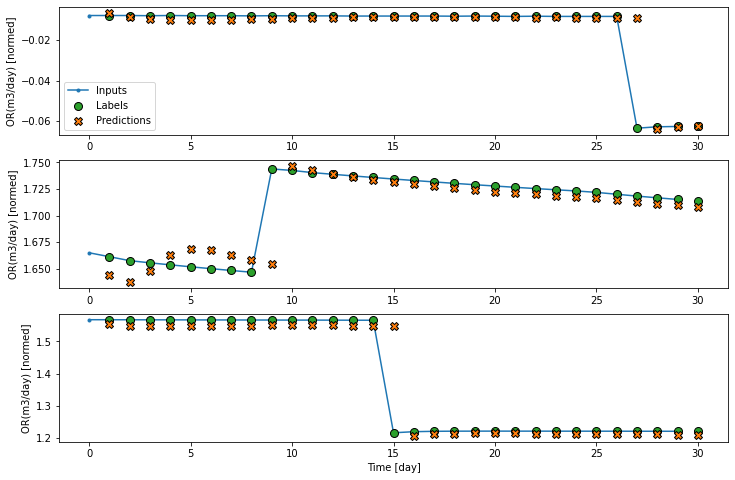

In [ ]:
wide_window.plot(residual_lstm_model , plot_col='OR(m3/day)')

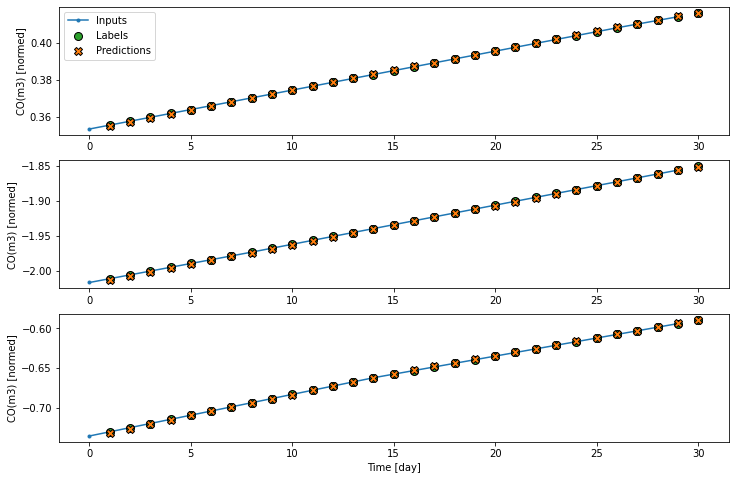

In [ ]:
wide_window.plot(residual_lstm_model , plot_col='CO(m3)')

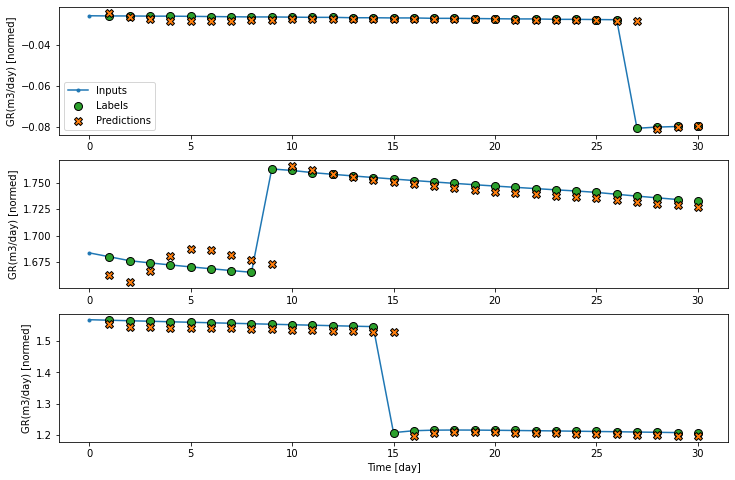

In [ ]:
wide_window.plot(residual_lstm_model , plot_col='GR(m3/day)')

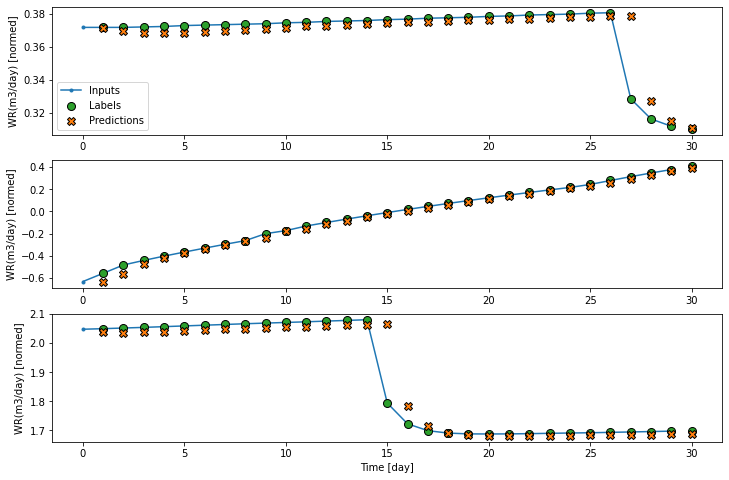

In [ ]:
wide_window.plot(residual_lstm_model , plot_col='WR(m3/day)')

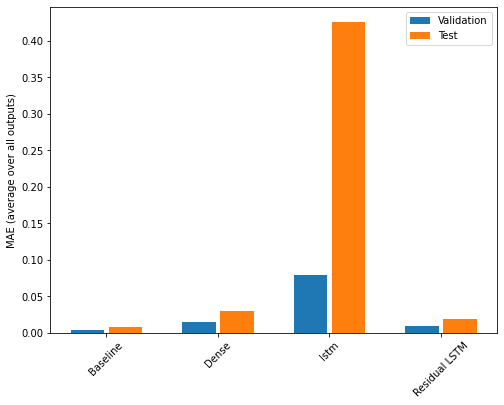

In [ ]:
x = np.arange(len(performance))
width = 0.3

metric_name = 'mean_absolute_error'
metric_index = lstm_model.metrics_names.index('mean_absolute_error')
val_mae = [v[metric_index] for v in val_performance.values()]
test_mae = [v[metric_index] for v in performance.values()]

plt.bar(x - 0.17, val_mae, width, label='Validation')
plt.bar(x + 0.17, test_mae, width, label='Test')
plt.xticks(ticks=x, labels=performance.keys(),
           rotation=45)
plt.ylabel('MAE (average over all outputs)')
_ = plt.legend()

In [ ]:
for name, value in performance.items():
  print(f'{name:15s}: {value[1]:0.4f}')

Baseline       : 0.0076
Dense          : 0.0299
lstm           : 0.4250
Residual LSTM  : 0.0186
